In [1]:
import scanpy as sc
import pandas as pd 
import numpy as np
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt
import warnings
from nero import Harmonia

In [2]:
# might need this, the most recent version of jupterlab I installed installed the most recent version of jedi which has been having problems with autocomplete
# see thread here: https://github.com/ipython/ipython/issues/10493
%config Completer.use_jedi = False

sc.settings.verbosity = 4
sc.settings.set_figure_params(dpi=80)

In [3]:
prefix = '/data/scripts/univ_v1_1_h_TB_low/outs/'

#HTO_classification = pd.read_csv('/wynton/group/ye/byungjin/mux_abseq/191224_novaseq/191205_v1_1_hm_1um_HTO_classification.csv',sep=',')

In [4]:
h5_path = prefix + 'filtered_feature_bc_matrix.h5'
# demux_path = prefix + 'cramore/demux.output.best'
vireo_path = '100K_TB_donor_ids.tsv'

In [5]:
#mymux = Harmonia.MuxOut(demux_path)
mymux = Harmonia.MuxOut(vireo_path)

In [6]:
print(mymux.num_drops)
print(mymux.sngrate)
print(mymux.dblrate)
print(mymux.ambrate)

42386
0.7432170999858444
0.24689756051526449
0.009885339498891144


In [7]:
raw_adata = sc.read_10x_h5(h5_path, gex_only=False) # need gex_only = False otherwise the custom feature barcodes don't show up
raw_adata.var_names_make_unique()

reading /data/scripts/univ_v1_1_h_TB_low/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)


In [8]:
adata = raw_adata.copy()

Extract out singlets and doublets only.

In [9]:
sngdbls = mymux.sngdbl()[['DROPLET.TYPE','BEST.GUESS']]
cells = sngdbls.loc[np.intersect1d(adata.obs_names.values,
                                   sngdbls.index.values,
                                   assume_unique=True),:]

Subset for singlets and doublets, and make some useful covariates.

In [10]:
cell_adata = adata[cells.index].copy()
cell_adata.obs['DROPTYPE'] = cells['DROPLET.TYPE']
cell_adata.obs['IND'] = cells['BEST.GUESS']

Remove platelets and RBCs.

In [11]:
mat = csr_matrix(cell_adata.X) # convert the underlying data matrix into a compressed sparse row matrix
mat = np.array(mat[:, cell_adata.var_names.isin(['PPBP'])].todense()).flatten() # get the counts of PPBP in each cell`
counts, nums = np.unique(mat,return_counts=True) #confirm we won't lose all of our cells
list(zip(nums,counts))

[(41940, 0.0), (21, 1.0), (3, 2.0), (1, 3.0), (1, 5.0), (1, 9.0)]

In [12]:
cell_adata = cell_adata[mat <= 1].copy()

In [13]:
mat = csr_matrix(cell_adata.X) # convert the underlying data matrix into a compressed sparse row matrix
mat = np.array(mat[:, cell_adata.var_names.isin(['HBB'])].todense()).flatten() # get the counts of PPBP in each cell`
counts, nums = np.unique(mat,return_counts=True) #confirm we won't lose all of our cells
list(zip(nums,counts))

[(41936, 0.0), (24, 1.0), (1, 2.0)]

In [14]:
cell_adata = cell_adata[mat <= 1].copy()

Get percentage mitochondria.

In [15]:
genelist = cell_adata.var_names.tolist()
mito_genes_names = [gn for gn in genelist if gn.startswith('MT-')]
mito_genes = [genelist.index(gn) for gn in mito_genes_names]
cell_adata.obs['percent_mito'] = np.ravel(np.sum(cell_adata[:, mito_genes].X, axis=1)) / np.ravel(np.sum(cell_adata.X, axis=1))

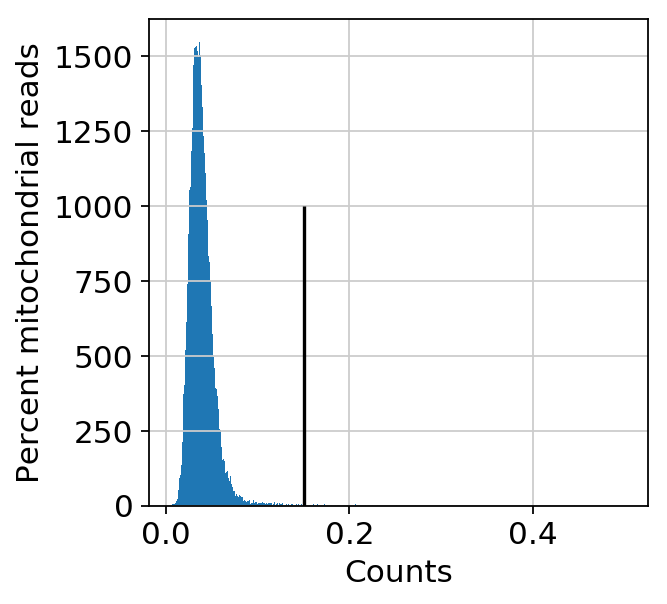

In [16]:
plt.hist(cell_adata.obs['percent_mito'].values,bins=500)
plt.vlines(0.15,0,1000);
plt.xlabel('Counts')
plt.ylabel('Percent mitochondrial reads');
# plt.xlim((0,0.1));

Only keep cells with low `percent_mito`.

In [17]:
cutoff = 0.15
cell_adata = cell_adata[cell_adata.obs['percent_mito'] < cutoff].copy()

In [18]:
cell_adata

AnnData object with n_obs × n_vars = 41889 × 33548 
    obs: 'DROPTYPE', 'IND', 'percent_mito'
    var: 'gene_ids', 'feature_types', 'genome'

Examine the number of genes expressed per cell.

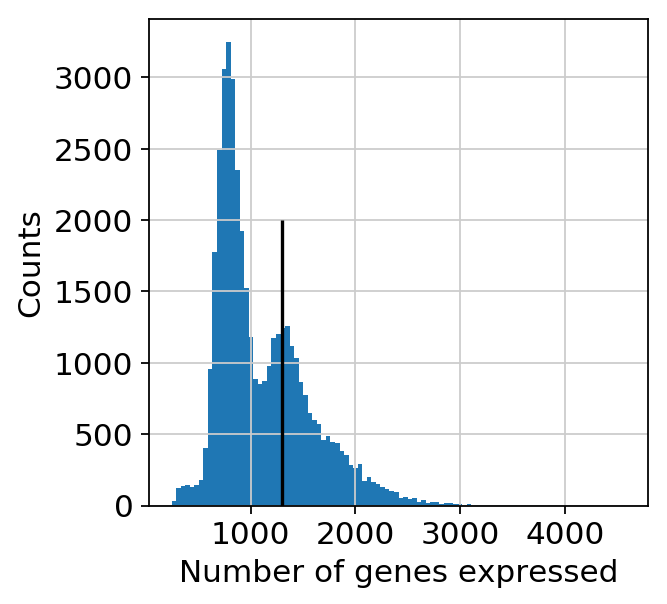

In [19]:
plt.hist(sc.pp.filter_cells(cell_adata, min_genes=0,inplace=False)[1],bins=100); # just to get out the number of genes expressed per cell
plt.ylabel('Counts')
plt.xlabel('Number of genes expressed');
plt.vlines(1300,0,2000);

I won't filter anything out here, but this may very well be a gauge for the doublets.

Standard processing here:

In [20]:
sc.pp.filter_genes(cell_adata,min_counts=1)

filtered out 10640 genes that are detected in less than 1 counts


In [21]:
adata.var.tail(10)

,gene_ids,feature_types,genome
CD4barcode1,Ab1CD4,Antibody Capture,
CD4barcode2,Ab2CD4,Antibody Capture,
CD4barcode3,Ab3CD4,Antibody Capture,
CD4barcode4,Ab4CD4,Antibody Capture,
CD4barcode5,Ab5CD4,Antibody Capture,
CD20barcode1,Ab1CD20,Antibody Capture,
CD20barcode2,Ab2CD20,Antibody Capture,
CD20barcode3,Ab3CD20,Antibody Capture,
CD20barcode4,Ab4CD20,Antibody Capture,
CD20barcode5,Ab5CD20,Antibody Capture,


In [35]:
cell_adata

AnnData object with n_obs × n_vars = 41889 × 22908 
    obs: 'DROPTYPE', 'IND', 'percent_mito'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts'

In [52]:
df_CD4h_1 =np. log1p(adata[:,'CD4barcode1'].to_df())
df_CD4h_2 = np. log1p(adata[:,'CD4barcode2'].to_df())
df_CD4h_3 = np. log1p(adata[:,'CD4barcode3'].to_df())
df_CD4h_4 = np. log1p(adata[:,'CD4barcode4'].to_df())
df_CD4h_5 = np.log1p(adata[:,'CD4barcode5'].to_df())

adata[:,'CD4barcode5'].to_df()

df_CD20h_1 = np.log1p(adata[:,'CD20barcode1'].to_df())
df_CD20h_2 = np.log1p(adata[:,'CD20barcode2'].to_df())
df_CD20h_3 = np.log1p(adata[:,'CD20barcode3'].to_df())
df_CD20h_4 = np.log1p(adata[:,'CD20barcode4'].to_df())
df_CD20h_5 = np.log1p(adata[:,'CD20barcode5'].to_df())

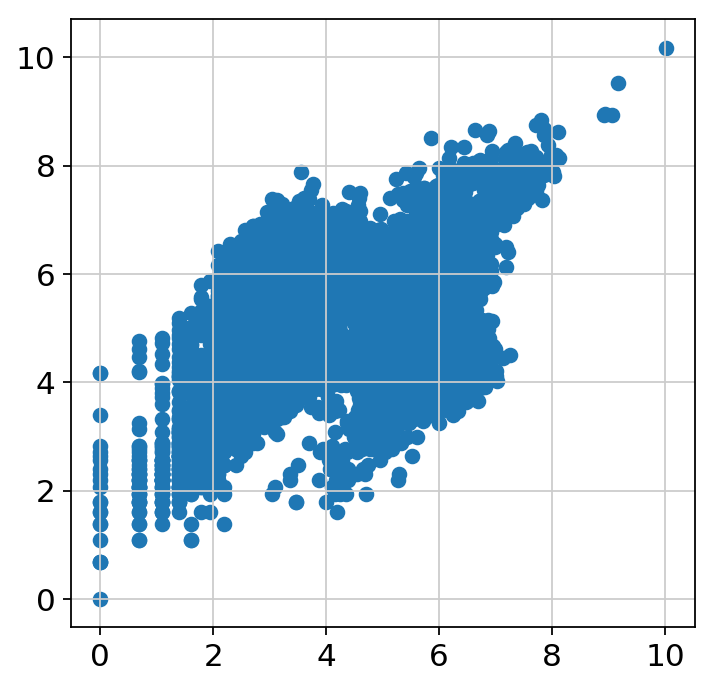

In [26]:
import pandas as pd
import seaborn as sns

plt.figure(figsize=(5,5))
#a=df_test_fin_total_log_z_adt2[df_test_fin_total_log_z_adt2['IND']=='donor0']
#b=df_test_fin_total_log_z_adt2[df_test_fin_total_log_z_adt2['IND']=='donor1']

s=plt.scatter(x=df_CD4h_1, y=df_CD20h_1)
#s=sns.scatterplot(x="CD4_h_merged", y="CD20_h_merged", data=a, s=20, marker='.', edgecolor=None, color='#D53E4F', zorder=2, label="donor1")

#plt.xlim(-3,4)
#plt.ylim(-3,4)

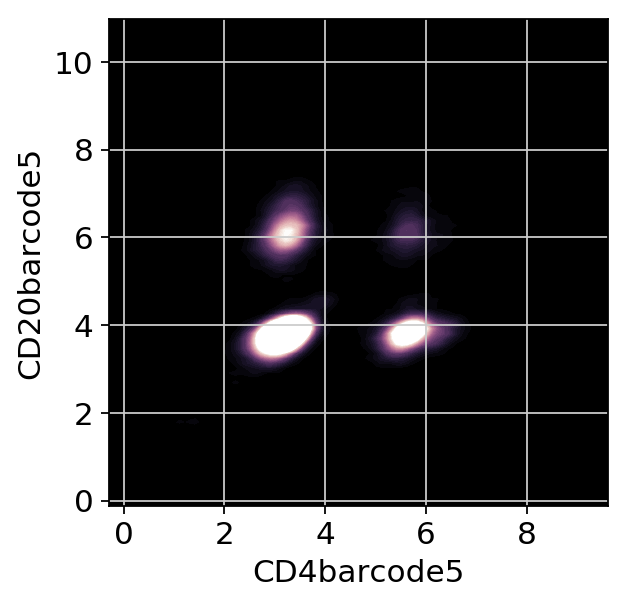

In [31]:
#### f, ax = plt.subplots(figsize=(5, 5))
cmap = sns.cubehelix_palette(as_cmap=True, dark=0, light=7, reverse=True)
g=sns.kdeplot(df_CD4h_5.CD4barcode5, df_CD20h_5.CD20barcode5, cmap=cmap, n_levels=300, shade=True);
plt.autoscale(True)

# Scatterplot  based on ADT counts¶

In [22]:
df_CD4h_1 = cell_adata[:,'CD4barcode1'].to_df()
df_CD4h_2 = cell_adata[:,'CD4barcode2'].to_df()
df_CD4h_3 = cell_adata[:,'CD4barcode3'].to_df()
df_CD4h_4 = cell_adata[:,'CD4barcode4'].to_df()
df_CD4h_5 = cell_adata[:,'CD4barcode5'].to_df()

df_CD20h_1 = cell_adata[:,'CD20barcode1'].to_df()
df_CD20h_2 = cell_adata[:,'CD20barcode2'].to_df()
df_CD20h_3 = cell_adata[:,'CD20barcode3'].to_df()
df_CD20h_4 = cell_adata[:,'CD20barcode4'].to_df()
df_CD20h_5 = cell_adata[:,'CD20barcode5'].to_df()

df_CD4h_merged = df_CD4h_1.join([df_CD4h_2,df_CD4h_3,df_CD4h_4,df_CD4h_5])
df_CD20h_merged = df_CD20h_1.join([df_CD20h_2,df_CD20h_3,df_CD20h_4,df_CD20h_5])

df_CD4h_merged['CD4_h_merged'] = df_CD4h_merged.sum(axis=1)
df_CD20h_merged['CD20_h_merged'] = df_CD20h_merged.sum(axis=1)

df_CD4_20_h_merged = df_CD4h_merged.join(df_CD20h_merged)
#type(cell_adata.obs['call'])
df_CD4_20_h_merged = df_CD4_20_h_merged.join(cell_adata.obs)

In [23]:
df_CD4_20_h_merged.head()

,CD4barcode1,CD4barcode2,CD4barcode3,CD4barcode4,CD4barcode5,CD4_h_merged,CD20barcode1,CD20barcode2,CD20barcode3,CD20barcode4,CD20barcode5,CD20_h_merged,DROPTYPE,IND,percent_mito
AAACCCAAGAATCGTA-1,12.0,295.0,13.0,18.0,18.0,356.0,34.0,32.0,3.0,426.0,20.0,515.0,SNG,donor0,0.033281
AAACCCAAGACCGCCT-1,8.0,23.0,1.0,18.0,9.0,59.0,36.0,304.0,3.0,20.0,31.0,394.0,SNG,donor0,0.056332
AAACCCAAGACCTGGA-1,7.0,24.0,3.0,12.0,14.0,60.0,34.0,280.0,2.0,20.0,22.0,358.0,SNG,donor0,0.045055
AAACCCAAGCGACTAG-1,6.0,187.0,7.0,4.0,7.0,211.0,24.0,36.0,3.0,20.0,20.0,103.0,SNG,donor1,0.024431
AAACCCAAGCGTGTTT-1,12.0,167.0,7.0,20.0,242.0,448.0,35.0,30.0,5.0,20.0,22.0,112.0,SNG,donor1,0.030292


In [26]:
df_CD4_20_h_merged.shape

(41889, 15)

In [51]:
df_CD4_20_h_merged.to_csv("200204_TB_low_merged_raw_counts.txt")

# Z-score norm or log1p + zscore

In [24]:
#df_call2 = df_CD4_20_h_merged['recall']
df_identity2 = df_CD4_20_h_merged['IND']

df_test_drop2 = df_CD4_20_h_merged.drop(['IND','DROPTYPE'],axis=1)

df_log1p=df_test_drop2.apply(np.log1p)

log_znorm_df=(df_log1p-df_log1p.mean())/df_log1p.std()

# log1p

In [24]:
df_log1p.head()

,CD4barcode1,CD4barcode2,CD4_h_merged,CD20barcode1,CD20barcode2,CD20_h_merged,percent_mito
AAACCCAAGAAGCGAA-1,5.529429,4.356709,5.796058,4.543295,4.158883,5.056246,0.041481
AAACCCAAGAATCTAG-1,3.332205,5.049856,5.209486,3.218876,3.663562,4.143135,0.027331
AAACCCAAGAGATGCC-1,5.257495,3.891820,5.480639,3.044523,3.891820,4.234107,0.019216
AAACCCAAGCCTAGGA-1,5.389072,4.663439,5.780744,4.290460,5.950643,6.122493,0.036673
AAACCCAAGCTGCCAC-1,3.713572,4.454347,4.836282,3.496508,5.726848,5.826000,0.033638


# Gaussian mixture model test

In [29]:
!date
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
%matplotlib inline
sns.set_context('paper')
sns.set_style('darkgrid')

Thu Jan 30 08:26:37 PST 2020


In [32]:

import pymc3 as pm, theano.tensor as tt

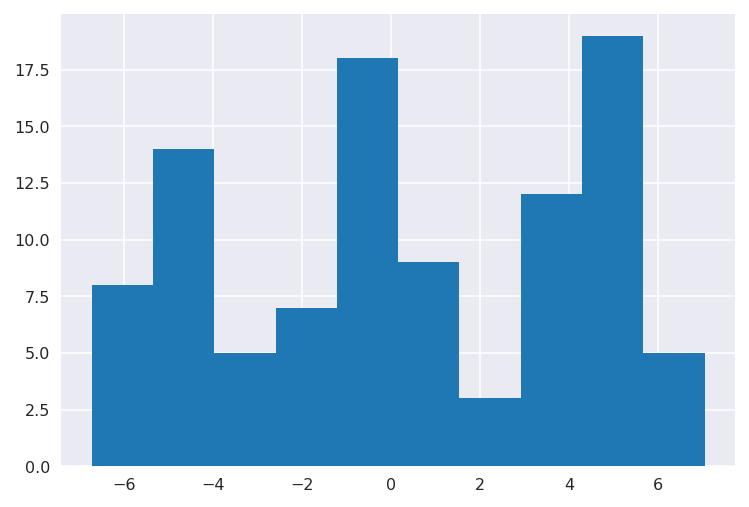

In [49]:
# simulate data from a known mixture distribution
np.random.seed(12345) # set random seed for reproducibility

k = 3
ndata = 100
spread = 5
centers = np.array([-spread, 0, spread])

# simulate data from mixture distribution
v = np.random.randint(0, k, ndata)
data = centers[v] + np.random.randn(ndata)

plt.hist(data);

In [194]:
len(df_log1p['CD4barcode1'])

34310

# gaussian mixture sklearn EM ...easy

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from sklearn.mixture import GaussianMixture

N=2
X1=df_log1p['CD4barcode1']
X2=df_log1p['CD4barcode2']
X3=df_log1p['CD4barcode3']
X4=df_log1p['CD4barcode4']
X5=df_log1p['CD4barcode5']
X6=df_log1p['CD20barcode1']
X7=df_log1p['CD20barcode2']
X8=df_log1p['CD20barcode3']
X9=df_log1p['CD20barcode4']
X10=df_log1p['CD20barcode5']
X11=df_log1p['CD4_h_merged']
X12=df_log1p['CD20_h_merged']

X1_1= X1.to_frame()
X2_1= X2.to_frame()
X3_1= X3.to_frame()
X4_1= X4.to_frame()
X5_1= X5.to_frame()
X6_1= X6.to_frame()
X7_1= X7.to_frame()
X8_1= X8.to_frame()
X9_1= X9.to_frame()
X10_1= X10.to_frame()
X11_1= X11.to_frame()
X12_1= X12.to_frame()

g1 = GaussianMixture(n_components=2).fit(X1_1)
g2 = GaussianMixture(n_components=2).fit(X2_1)
g3 = GaussianMixture(n_components=2).fit(X3_1)
g4 = GaussianMixture(n_components=2).fit(X4_1)
g5 = GaussianMixture(n_components=2).fit(X5_1)
g6 = GaussianMixture(n_components=2).fit(X6_1)
g7 = GaussianMixture(n_components=2).fit(X7_1)
g8 = GaussianMixture(n_components=2).fit(X8_1)
g9 = GaussianMixture(n_components=2).fit(X9_1)
g10 = GaussianMixture(n_components=2).fit(X10_1)
g11 = GaussianMixture(n_components=2).fit(X11_1)
g12 = GaussianMixture(n_components=2).fit(X12_1)

#g.predict_proba(X2)
#g.fit_predict(X2)
m1 = g1.means_
m2 = g2.means_
m3 = g3.means_
m4 = g4.means_
m5 = g5.means_
m6 = g6.means_
m7 = g7.means_
m8 = g8.means_
m9 = g9.means_
m10 = g10.means_
m11 = g11.means_
m12 = g12.means_

cov1 = g1.covariances_
cov2 = g2.covariances_
cov3 = g3.covariances_
cov4 = g4.covariances_
cov5 = g5.covariances_
cov6 = g6.covariances_
cov7 = g7.covariances_
cov8 = g8.covariances_
cov9 = g9.covariances_
cov10 = g10.covariances_
cov11 = g11.covariances_
cov12 = g12.covariances_

sigmas1 = [np.sqrt(np.trace(cov1[i])/N) for i in range(0,N) ]
sigmas2 = [np.sqrt(np.trace(cov2[i])/N) for i in range(0,N) ]
sigmas3 = [np.sqrt(np.trace(cov3[i])/N) for i in range(0,N) ]
sigmas4 = [np.sqrt(np.trace(cov4[i])/N) for i in range(0,N) ]
sigmas5 = [np.sqrt(np.trace(cov5[i])/N) for i in range(0,N) ]
sigmas6 = [np.sqrt(np.trace(cov6[i])/N) for i in range(0,N) ]
sigmas7 = [np.sqrt(np.trace(cov7[i])/N) for i in range(0,N) ]
sigmas8 = [np.sqrt(np.trace(cov8[i])/N) for i in range(0,N) ]
sigmas9 = [np.sqrt(np.trace(cov9[i])/N) for i in range(0,N) ]
sigmas10 = [np.sqrt(np.trace(cov10[i])/N) for i in range(0,N) ]
sigmas11 = [np.sqrt(np.trace(cov11[i])/N) for i in range(0,N) ]
sigmas12 = [np.sqrt(np.trace(cov12[i])/N) for i in range(0,N) ]

sigma_fin_1=np.mean(sigmas1)
sigma_fin_2=np.mean(sigmas2)
sigma_fin_3=np.mean(sigmas3)
sigma_fin_4=np.mean(sigmas4)
sigma_fin_5=np.mean(sigmas5)
sigma_fin_6=np.mean(sigmas6)
sigma_fin_7=np.mean(sigmas7)
sigma_fin_8=np.mean(sigmas8)
sigma_fin_9=np.mean(sigmas9)
sigma_fin_10=np.mean(sigmas10)
sigma_fin_11=np.mean(sigmas11)
sigma_fin_12=np.mean(sigmas12)

mean_fin_1 = np.mean(m1)
mean_fin_2 = np.mean(m2)
mean_fin_3 = np.mean(m3)
mean_fin_4 = np.mean(m4)
mean_fin_5 = np.mean(m5)
mean_fin_6 = np.mean(m6)
mean_fin_7 = np.mean(m7)
mean_fin_8 = np.mean(m8)
mean_fin_9 = np.mean(m9)
mean_fin_10 = np.mean(m10)
mean_fin_11 = np.mean(m11)
mean_fin_12 = np.mean(m12)


CD4_barcode1_norm = (df_log1p['CD4barcode1'] - mean_fin_1) /  sigma_fin_1
CD4_barcode2_norm = (df_log1p['CD4barcode2'] - mean_fin_2) /  sigma_fin_2
CD4_barcode3_norm = (df_log1p['CD4barcode3'] - mean_fin_3) /  sigma_fin_3
CD4_barcode4_norm = (df_log1p['CD4barcode4'] - mean_fin_4) /  sigma_fin_4
CD4_barcode5_norm = (df_log1p['CD4barcode5'] - mean_fin_5) /  sigma_fin_5

CD20_barcode1_norm = (df_log1p['CD20barcode1'] - mean_fin_6) /  sigma_fin_6
CD20_barcode2_norm = (df_log1p['CD20barcode2'] - mean_fin_7) /  sigma_fin_7
CD20_barcode3_norm = (df_log1p['CD20barcode3'] - mean_fin_8) /  sigma_fin_8
CD20_barcode4_norm = (df_log1p['CD20barcode4'] - mean_fin_9) /  sigma_fin_9
CD20_barcode5_norm = (df_log1p['CD20barcode5'] - mean_fin_10) /  sigma_fin_10

CD4_barcode_m_norm = (df_log1p['CD4_h_merged'] - mean_fin_11) /  sigma_fin_11
CD20_barcode_m_norm = (df_log1p['CD20_h_merged'] - mean_fin_12) /  sigma_fin_12

a = CD4_barcode1_norm.to_frame()
b = CD4_barcode2_norm.to_frame()
c = CD4_barcode3_norm.to_frame()
d = CD4_barcode4_norm.to_frame()
e = CD4_barcode5_norm.to_frame()

f = CD20_barcode1_norm.to_frame()
g = CD20_barcode2_norm.to_frame()
h = CD20_barcode3_norm.to_frame()
i = CD20_barcode4_norm.to_frame()
j = CD20_barcode5_norm.to_frame()

k = CD4_barcode_m_norm.to_frame()
l = CD20_barcode_m_norm.to_frame()

total = a.join([b,c,d, e, f,g,h,i,j,k,l])

gmm_df = total.join(df_identity2)
gmm_df.head()


,CD4barcode1,CD4barcode2,CD4barcode3,CD4barcode4,CD4barcode5,CD20barcode1,CD20barcode2,CD20barcode3,CD20barcode4,CD20barcode5,CD4_h_merged,CD20_h_merged,IND
AAACCCAAGAATCGTA-1,-5.041030,4.511879,-1.739320,-4.501061,-4.139846,-3.641667,-3.747341,-4.359426,4.872602,-5.544464,2.833832,2.372427,donor0
AAACCCAAGACCGCCT-1,-6.354228,-3.778059,-7.659731,-4.501061,-6.533070,-3.450651,3.454040,-4.359426,-5.477274,-4.017478,-3.240815,1.499456,donor0
AAACCCAAGACCTGGA-1,-6.774848,-3.643357,-5.550838,-5.913041,-5.021248,-3.641667,3.188638,-5.120233,-5.477274,-5.214673,-3.184514,1.187264,donor0
AAACCCAAGCGACTAG-1,-7.251708,3.014072,-3.441945,-9.468244,-7.365086,-4.798264,-3.376845,-4.359426,-5.477274,-5.544464,1.058676,-2.860141,donor1
AAACCCAAGCGTGTTT-1,-5.041030,2.642924,-3.441945,-4.128676,5.362980,-3.544832,-3.949802,-3.287128,-5.477274,-5.214673,3.614838,-2.589002,donor1


In [50]:
ctype_gmm_df = gmm_df.join(df_cell_type)
ctype_gmm_df.head()

,CD4barcode1,CD4barcode2,CD4barcode3,CD4barcode4,CD4barcode5,CD20barcode1,CD20barcode2,CD20barcode3,CD20barcode4,CD20barcode5,CD4_h_merged,CD20_h_merged,IND,cell_type
AAACCCAAGAGGGTGG-1,4.733284,-3.277682,-5.795436,-4.133350,-3.223359,-2.632383,-3.192880,-3.689830,-5.048341,-5.011944,0.794450,-2.594130,donor0,CD4 T cells
AAACCCAAGAGTACCG-1,-7.412143,-4.377030,-5.219645,-5.564325,-5.268178,2.594677,-3.365332,-6.024014,-4.677746,-4.203479,-3.489392,-0.032456,donor1,B cells
AAACCCAAGATAGTCA-1,-4.031731,-4.486100,-5.795436,-4.643313,-4.923054,-2.738380,-3.424875,-4.114493,3.421363,-4.722452,-2.866021,0.742578,donor1,B cells
AAACCCAAGCACTTTG-1,4.433414,-3.607642,-3.030609,-5.394561,-3.330232,-2.738380,-2.065020,-1.590242,-4.263456,-4.541281,0.573320,-1.950616,donor0,CD4 T cells
AAACCCAAGCGCCTTG-1,-5.044194,-2.975840,-5.795436,3.778203,-5.091693,-3.018585,-2.675487,-2.444674,-3.892861,-4.816464,0.490091,-2.241931,donor0,CD4 T cells


In [102]:
k=2
ndata = len(df_log1p['CD4barcode1'])
model = pm.Model()
with model:
    # cluster sizes
    p = pm.Dirichlet('p', a=np.array([1., 1.]), shape=k)
    # ensure all clusters have some points
    p_min_potential = pm.Potential('p_min_potential', tt.switch(tt.min(p) < .1, -np.inf, 0))

#+ tt.switch(means[2]-means[1] < 0, -np.inf, 0))
    # cluster centers
    means = pm.Normal('means', mu=[3.5, 5.5], sigma=0.1, shape=k)
    # break symmetry
    order_means_potential = pm.Potential('order_means_potential', tt.switch(means[1]-means[0] < 0, -np.inf, 0))
    # measurement error
    sd = pm.Uniform('sd', lower=0, upper=2)

    # latent cluster of each observation
    category = pm.Categorical('category',
                              p=p,
                              shape=ndata)

    # likelihood for each observed value
    post = pm.Normal('obs',
                       mu=means[category],
                       sigma=sd,
                       observed=df_log1p['CD4_h_merged'])

In [103]:
with model:
    step1 = pm.Metropolis(vars=[p, sd, means])
    step2 = pm.ElemwiseCategorical(vars=[category], values=[0, 1])
    tr = pm.sample(200, step=[step1, step2], tune=10)

/home/bhwang1/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: ElemwiseCategorical is deprecated, switch to CategoricalGibbsMetropolis.
  This is separate from the ipykernel package so we can avoid doing imports until
Only 200 samples in chain.
Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>CompoundStep
>>Metropolis: [means]
>>Metropolis: [sd]
>>Metropolis: [p]
>ElemwiseCategorical: [category]
Sampling 4 chains, 0 divergences: 100%|██████████| 840/840 [03:00<00:00,  4.66draws/s]
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


In [104]:
pm.summary(tr)

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
means[0],3.509,0.066,3.481,3.500,0.014,0.010,21.0,20.0,10.0,8.0,4.43
means[1],5.482,0.038,5.404,5.500,0.016,0.012,6.0,6.0,4.0,7.0,4.05
category[0],0.996,0.061,1.000,1.000,0.004,0.003,277.0,277.0,277.0,800.0,1.01
category[1],0.000,0.000,0.000,0.000,0.000,0.000,800.0,800.0,800.0,800.0,NaN
category[2],0.999,0.035,1.000,1.000,0.001,0.001,816.0,816.0,816.0,800.0,1.00
...,...,...,...,...,...,...,...,...,...,...,...
category[34308],0.999,0.035,1.000,1.000,0.001,0.001,816.0,816.0,816.0,800.0,1.00
category[34309],0.001,0.035,0.000,0.000,0.001,0.001,816.0,816.0,816.0,816.0,1.00
p[0],0.500,0.007,0.487,0.507,0.003,0.002,7.0,7.0,6.0,5.0,2.97
p[1],0.500,0.007,0.493,0.513,0.003,0.002,7.0,7.0,6.0,10.0,2.97


In [48]:
gmm = pm.Model()
K=2
N = len(df_log1p['CD3barcode2'])

with gmm:
    p = pm.Dirichlet('p', a=np.array([1,]*K))
    
    z = pm.Categorical('z', p=p, shape=N)
    mu = pm.Normal('mu', mu=4, sd=10, shape=K)
    sigma = pm.HalfCauchy('sigma', beta=1., shape=K)
    
    y_obs = pm.Normal('y_abs', mu=mu[z], sd=sigma[z], observed=df_log1p['CD3barcode2'])

INFO (theano.gof.compilelock): Refreshing lock /home/bhwang1/.theano/compiledir_Linux-4.15--aws-x86_64-with-debian-buster-sid-x86_64-3.7.4-64/lock_dir/lock


In [49]:
seed = 68492
np.random.seed(seed)

with gmm:
    step1 = pm.NUTS(vars=[p,mu,sigma])
    step2 = pm.ElemwiseCategorical(vars=[z])
    
    trace = pm.sample(draws=150,  step=[step1, step2], random_seed = seed )

/home/bhwang1/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: ElemwiseCategorical is deprecated, switch to CategoricalGibbsMetropolis.
  
Only 150 samples in chain.
Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [sigma, mu, p]
>ElemwiseCategorical: [z]
Sampling 4 chains, 0 divergences: 100%|██████████| 2600/2600 [04:58<00:00,  8.72draws/s]
INFO (theano.gof.compilelock): Refreshing lock /home/bhwang1/.theano/compiledir_Linux-4.15--aws-x86_64-with-debian-buster-sid-x86_64-3.7.4-64/lock_dir/lock
The acceptance probability does not match the target. It is 0.8824483533793733, but should be close to 0.8. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.87907754687913, but should be close to 0.8. Try to increase the number of tuning steps.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 20

In [52]:
pm.summary(trace)

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
z[0],0.502,0.500,0.000,1.000,0.213,0.160,6.0,6.0,6.0,6.0,2.07
z[1],0.487,0.500,0.000,1.000,0.147,0.107,12.0,12.0,12.0,12.0,1.27
z[2],0.500,0.500,0.000,1.000,0.245,0.187,4.0,4.0,4.0,4.0,22658449.41
z[3],0.487,0.500,0.000,1.000,0.204,0.152,6.0,6.0,6.0,6.0,1.86
z[4],0.480,0.500,0.000,1.000,0.202,0.151,6.0,6.0,6.0,6.0,1.82
...,...,...,...,...,...,...,...,...,...,...,...
mu[1],3.619,0.467,3.147,4.110,0.229,0.175,4.0,4.0,7.0,122.0,1.73
p[0],0.500,0.181,0.310,0.687,0.089,0.068,4.0,4.0,6.0,169.0,1.74
p[1],0.500,0.181,0.313,0.690,0.089,0.068,4.0,4.0,6.0,169.0,1.74
sigma[0],0.777,0.534,0.238,1.325,0.262,0.200,4.0,4.0,6.0,179.0,1.75


/home/bhwang1/anaconda3/lib/python3.7/site-packages/pymc3/plots/__init__.py:21: UserWarning: Keyword argument `varnames` renamed to `var_names`, and will be removed in pymc3 3.8
  warnings.warn('Keyword argument `{old}` renamed to `{new}`, and will be removed in pymc3 3.8'.format(old=old, new=new))
/home/bhwang1/anaconda3/lib/python3.7/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
/home/bhwang1/anaconda3/lib/python3.7/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in matplotlib.plot_distSupplied value won't be used
  "Argument backend_kwargs has not effect in matplotlib.plot_dist"
/home/bhwang1/anaconda3/lib/python3.7/site-packages/arviz/plots/backends/matplotlib/distplot.py:38: UserWarning: Argument backend_kwargs has not effect in mat

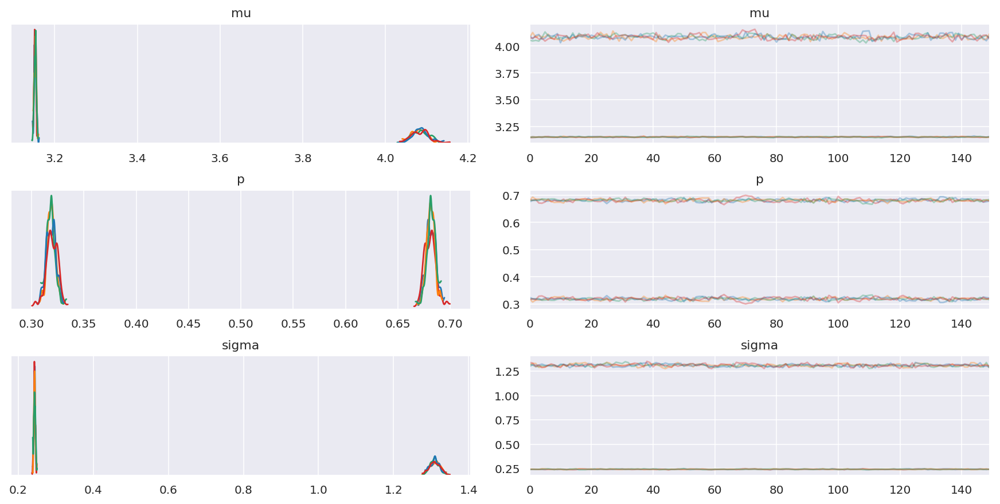

In [51]:
pm.traceplot(trace, varnames=['mu', 'p', 'sigma'])
plt.show()

In [193]:
from pymc3.math import logsumexp
from pymc3 import Normal, Metropolis, sample, MvNormal, Dirichlet, \
    DensityDist, find_MAP, NUTS, Slice

In [326]:
k= 2
#comp_dists = [norm1, norm2]
with pm.Model() as model:
    
    norm1= pm.Normal.dist(mu=3, sigma=0.1)
    norm2 = pm.Normal.dist(mu=6, sigma=0.1)

    w = pm.Dirichlet('w', a=np.array([1,1]))
    
   # means = pm.Normal('means', mu=[3,6], sigma=0.1, shape=k)
    sd = pm.Uniform('sd', lower=0, upper=10)

    like = pm.Mixture('like', w=w, comp_dists = [norm1, norm2], observed=df_log1p['CD3barcode2'])

In [328]:
pm.summary(trace)

,mean,sd,hpd_3%,hpd_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
w[0],0.837,0.003,0.832,0.842,0.000,0.000,590.0,590.0,589.0,454.0,1.00
w[1],0.163,0.003,0.158,0.168,0.000,0.000,590.0,590.0,589.0,454.0,1.00
sd,5.030,2.999,0.290,9.625,0.286,0.203,110.0,109.0,103.0,93.0,1.09


In [330]:
trace.stat_names

{'depth',
 'diverging',
 'energy',
 'energy_error',
 'max_energy_error',
 'mean_tree_accept',
 'model_logp',
 'step_size',
 'step_size_bar',
 'tree_size',
 'tune'}

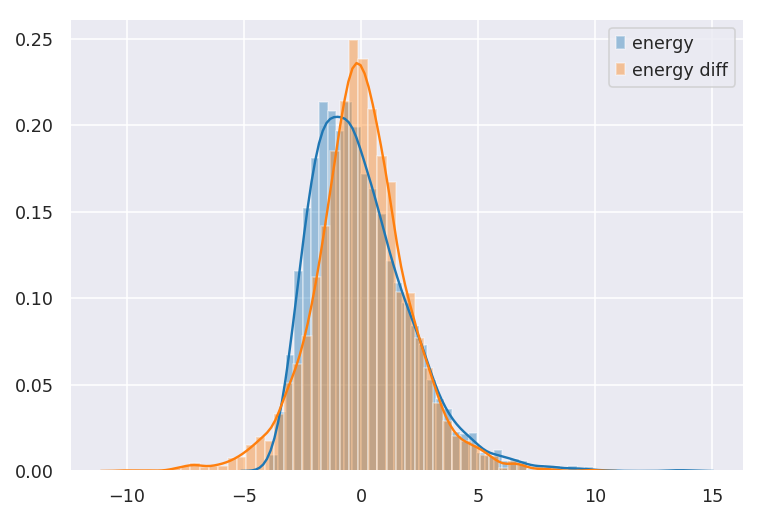

In [294]:
import seaborn as sb

energy = trace['energy']
energy_diff = np.diff(energy)
sb.distplot(energy - energy.mean(), label='energy')
sb.distplot(energy_diff, label='energy diff')
plt.legend()

In [176]:
with model:
    ppc_trace = pm.sample_posterior_predictive(trace, 500)

100%|██████████| 500/500 [00:17<00:00, 28.82it/s]


In [199]:
(ppc_trace['like'])

array([[-1.46579141, -0.30113458, -0.06967847, ...,  1.24930796,
        -0.9284513 , -0.46101122],
       [-0.99314101,  1.09904475,  0.15175655, ..., -0.33713057,
         0.42570019, -0.39732661],
       [-0.18214425, -0.36618647, -0.48903423, ..., -0.20921048,
        -0.38422988, -1.20041586],
       ...,
       [-0.68347639,  0.059176  ,  0.23058266, ...,  0.54427518,
         0.92984348, -1.46419283],
       [-0.38980572, -0.37509286,  0.33069366, ..., -0.84118663,
         0.20962141, -0.85282852],
       [-0.15542852,  1.37595545, -0.91659475, ...,  0.81583941,
         1.68637465, -0.88530125]])

In [46]:
ctype_gmm_df = gmm_df.join(df_cell_type)

In [47]:
ctype_gmm_df.head()

,CD4barcode1,CD4barcode2,CD4barcode3,CD4barcode4,CD4barcode5,CD20barcode1,CD20barcode2,CD20barcode3,CD20barcode4,CD20barcode5,CD4_h_merged,CD20_h_merged,IND,cell_type
AAACCCAAGAATCGTA-1,-5.041030,4.511879,-1.739320,-4.501061,-4.139846,-3.641667,-3.747341,-4.359426,4.872602,-5.544464,2.833832,2.372427,donor0,Doublets
AAACCCAAGACCGCCT-1,-6.354228,-3.778059,-7.659731,-4.501061,-6.533070,-3.450651,3.454040,-4.359426,-5.477274,-4.017478,-3.240815,1.499456,donor0,B cells
AAACCCAAGACCTGGA-1,-6.774848,-3.643357,-5.550838,-5.913041,-5.021248,-3.641667,3.188638,-5.120233,-5.477274,-5.214673,-3.184514,1.187264,donor0,B cells
AAACCCAAGCGACTAG-1,-7.251708,3.014072,-3.441945,-9.468244,-7.365086,-4.798264,-3.376845,-4.359426,-5.477274,-5.544464,1.058676,-2.860141,donor1,CD4 T cells
AAACCCAAGCGTGTTT-1,-5.041030,2.642924,-3.441945,-4.128676,5.362980,-3.544832,-3.949802,-3.287128,-5.477274,-5.214673,3.614838,-2.589002,donor1,CD4 T cells


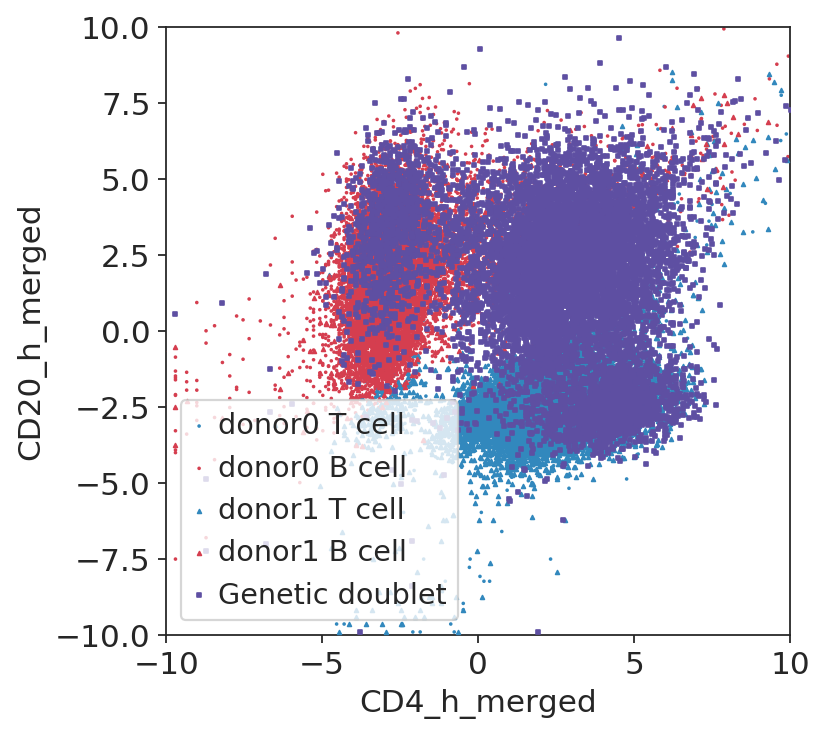

In [50]:
import pandas as pd
import seaborn as sns

plt.figure(figsize=(5,5))

sns.set_style("ticks")
a=ctype_gmm_df[(ctype_gmm_df['IND']=='donor0')&(ctype_gmm_df['cell_type']=='CD4 T cells')]
b=ctype_gmm_df[(ctype_gmm_df['IND']=='donor0')&(ctype_gmm_df['cell_type']=='B cells')]
c=ctype_gmm_df[(ctype_gmm_df['IND']=='donor1')&(ctype_gmm_df['cell_type']=='CD4 T cells')]
d=ctype_gmm_df[(ctype_gmm_df['IND']=='donor1')&(ctype_gmm_df['cell_type']=='B cells')]
e = ctype_gmm_df[ctype_gmm_df['IND']=='donor0,donor1']


s=sns.scatterplot(x="CD4_h_merged", y="CD20_h_merged", data=a, s=3, marker='.', facecolors='None', edgecolor='#3288BD', zorder=1, label="donor0 T cell")
s=sns.scatterplot(x="CD4_h_merged", y="CD20_h_merged", data=b, s=3, marker='.', facecolors='None', edgecolor='#D53E4F', zorder=2, label="donor0 B cell")
s=sns.scatterplot(x="CD4_h_merged", y="CD20_h_merged", data=c, s=3, marker='^', edgecolor=None, color='#3288BD', zorder=3, label="donor1 T cell")
s=sns.scatterplot(x="CD4_h_merged", y="CD20_h_merged", data=d, s=3, marker='^', edgecolor=None, color='#D53E4F', zorder=4, label="donor1 B cell")
s=sns.scatterplot(x="CD4_h_merged", y="CD20_h_merged", data=e, s=3, marker=',', edgecolor=None, color='#5E4FA2', zorder=5, label="Genetic doublet")

plt.xlim(-10,10)
plt.ylim(-10,10)

f = s.get_figure()
f.savefig("200204_v1.1_100K_TB_h_merged_donor_group_plot.png")

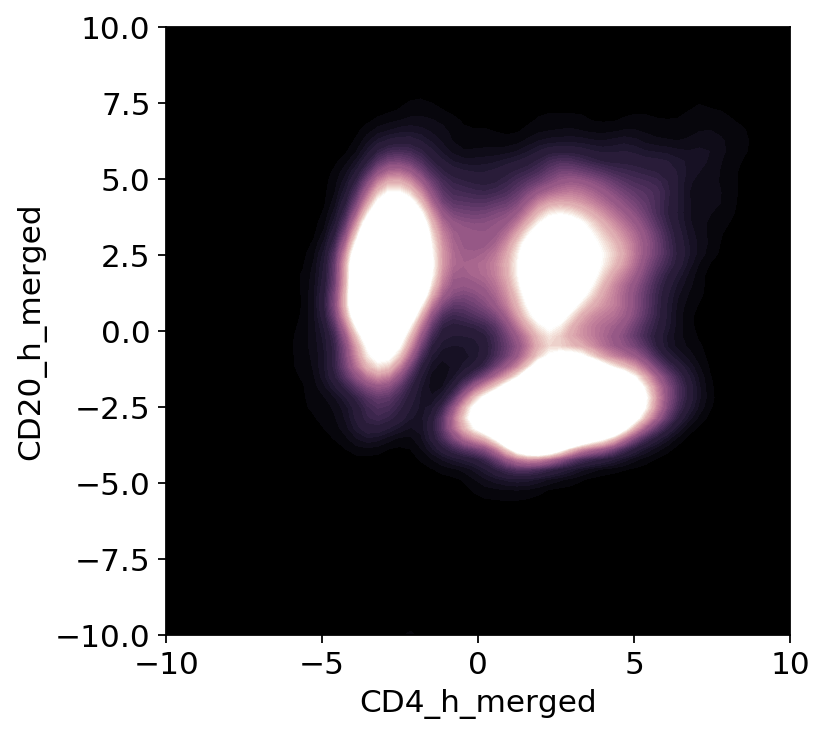

In [49]:
import seaborn as sns
f, ax = plt.subplots(figsize=(5, 5))
cmap = sns.cubehelix_palette(as_cmap=True, dark=0, light=7, reverse=True)
g=sns.kdeplot(ctype_gmm_df.CD4_h_merged, ctype_gmm_df.CD20_h_merged, cmap=cmap, n_levels=300, shade=True);
plt.autoscale(True)
g.set(ylim=(-10,10))
g.set(xlim=(-10,10))
g.grid(False)

f = g.get_figure()
f.savefig("200204_v1.1_100K_TB_h_unresolved_density_plot.png")

In [52]:
ctype_gmm_df.to_csv("200204_v1.1_TB_5batch_low_log_gmm_add_column_summary_matrix.csv")

# for fig2 result writing

In [24]:
df_gmm_ctype_reload=pd.read_table("200204_v1.1_TB_5batch_low_log_gmm_add_column_summary_matrix.csv", sep=",")

In [28]:
df_gmm_ctype_reload.head()

,Unnamed: 0,CD4barcode1,CD4barcode2,CD4barcode3,CD4barcode4,CD4barcode5,CD20barcode1,CD20barcode2,CD20barcode3,CD20barcode4,CD20barcode5,CD4_h_merged,CD20_h_merged,IND,cell_type
0,AAACCCAAGAATCGTA-1,-5.041030,4.511879,-1.739320,-4.501061,-4.139846,-3.641667,-3.747341,-4.359426,4.872602,-5.544464,2.833832,2.372427,donor0,Doublets
1,AAACCCAAGACCGCCT-1,-6.354228,-3.778059,-7.659731,-4.501061,-6.533070,-3.450651,3.454040,-4.359426,-5.477274,-4.017478,-3.240815,1.499456,donor0,B cells
2,AAACCCAAGACCTGGA-1,-6.774848,-3.643357,-5.550838,-5.913041,-5.021248,-3.641667,3.188638,-5.120233,-5.477274,-5.214673,-3.184514,1.187264,donor0,B cells
3,AAACCCAAGCGACTAG-1,-7.251708,3.014072,-3.441945,-9.468244,-7.365086,-4.798264,-3.376845,-4.359426,-5.477274,-5.544464,1.058676,-2.860141,donor1,CD4 T cells
4,AAACCCAAGCGTGTTT-1,-5.041030,2.642924,-3.441945,-4.128676,5.362980,-3.544832,-3.949802,-3.287128,-5.477274,-5.214673,3.614838,-2.589002,donor1,CD4 T cells


In [32]:
df_gmm_ctype_reload[df_gmm_ctype_reload['cell_type']=='CD4 T cells'].shape[0]/df_gmm_ctype_reload.shape[0]

0.4282031082145671

In [33]:
df_gmm_ctype_reload[df_gmm_ctype_reload['cell_type']=='B cells'].shape[0]/df_gmm_ctype_reload.shape[0]

0.33658000907159397

In [34]:
df_gmm_ctype_reload[df_gmm_ctype_reload['cell_type']=='Doublets'].shape[0]/df_gmm_ctype_reload.shape[0]

0.23521688271383895

# resolution plots

In [36]:
df_gmm_log_resolved = pd.read_table("200204_v1.1_1um_TB_low_5batch_summary_resolved.txt", sep="\t")

In [62]:
df_gmm_log_resolved.shape

(209445, 5)

# HTO classify negatives and reload and plot

In [38]:
df_log_negative = pd.read_table("200204_TB_low_negatives_HTO_0.95.txt", sep=" ", header=None)

In [39]:
df_log_negative.columns = ['cell', 'negatives']

In [40]:
df_log_negative.head()

,cell,negatives
0,1,Negative
1,2,Singlet
2,3,Negative
3,4,Singlet
4,5,Negative


In [42]:
df_log_negative.shape

(209445, 2)

In [43]:
df_gmm_log_resolved.shape

(209445, 5)

In [44]:
df_fin_resolved = df_gmm_log_resolved.join(df_log_negative['negatives'])

In [45]:
df_fin_resolved

,CD4h_resolved,CD20h_resolved,Pool,IND,CT,negatives
0,-5.041030,-3.641667,Pool1,donor0,Doublets,Negative
1,4.511879,-3.747341,Pool2,donor0,Doublets,Singlet
2,-1.739320,-4.359426,Pool3,donor0,Doublets,Negative
3,-4.501061,4.872602,Pool4,donor0,Doublets,Singlet
4,-4.139846,-5.544464,Pool5,donor0,Doublets,Negative
...,...,...,...,...,...,...
209440,-5.326874,-3.741310,Pool1,donor1,CD4 T cells,Negative
209441,5.387884,2.595918,Pool2,donor1,CD4 T cells,Doublet
209442,-5.550838,-8.025635,Pool3,donor1,CD4 T cells,Negative
209443,-5.380600,-6.870418,Pool4,donor1,CD4 T cells,Negative


In [46]:
df_fin_resolved[df_fin_resolved['CT']=='CD4 T cells'].shape[0] / df_fin_resolved.shape[0]

0.4282031082145671

In [47]:
df_fin_resolved[df_fin_resolved['CT']=='B cells'].shape[0] / df_fin_resolved.shape[0]

0.33658000907159397

In [48]:
df_fin_resolved[df_fin_resolved['CT']=='Doublets'].shape[0] / df_fin_resolved.shape[0]

0.23521688271383895

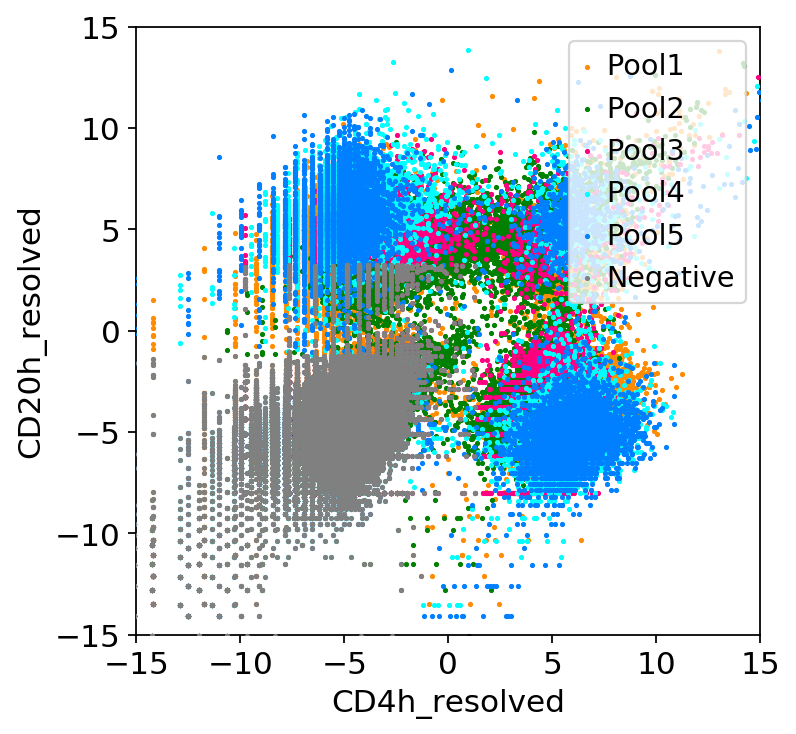

In [16]:
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin_resolved[df_fin_resolved['Pool']=='Pool1']
b=df_fin_resolved[df_fin_resolved['Pool']=='Pool2']
c=df_fin_resolved[df_fin_resolved['Pool']=='Pool3']
d=df_fin_resolved[df_fin_resolved['Pool']=='Pool4']
e=df_fin_resolved[df_fin_resolved['Pool']=='Pool5']
f=df_fin_resolved[df_fin_resolved['negatives']=='Negative']

s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=a, s=10, marker='.', edgecolor=None, color='darkorange', zorder=1, label="Pool1")
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=b, s=10, marker='.', edgecolor=None, color='green', zorder=2, label="Pool2")
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=c, s=10, marker='.', edgecolor=None, color='#FF0080', zorder=3, label="Pool3")
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=d, s=10, marker='.', edgecolor=None, color='#00FFFF', zorder=4, label="Pool4")
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=e, s=10, marker='.', edgecolor=None, color='#0080FF', zorder=4, label="Pool5")
#s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=b, s=10, marker='^', edgecolor='#D53E4F', facecolors='None', zorder=1, label="donor1")
s=sns.scatterplot(x="CD4h_resolved",  y="CD20h_resolved", data=f, s=10, marker='.', edgecolor=None, color='grey', zorder=5, label="Negative")


plt.xlim(-15,15)
plt.ylim(-15,15)
s.grid(False)

f = s.get_figure()
f.savefig("200204_v1.1_100K_TB_h_resolved_batch_group_plot.png")

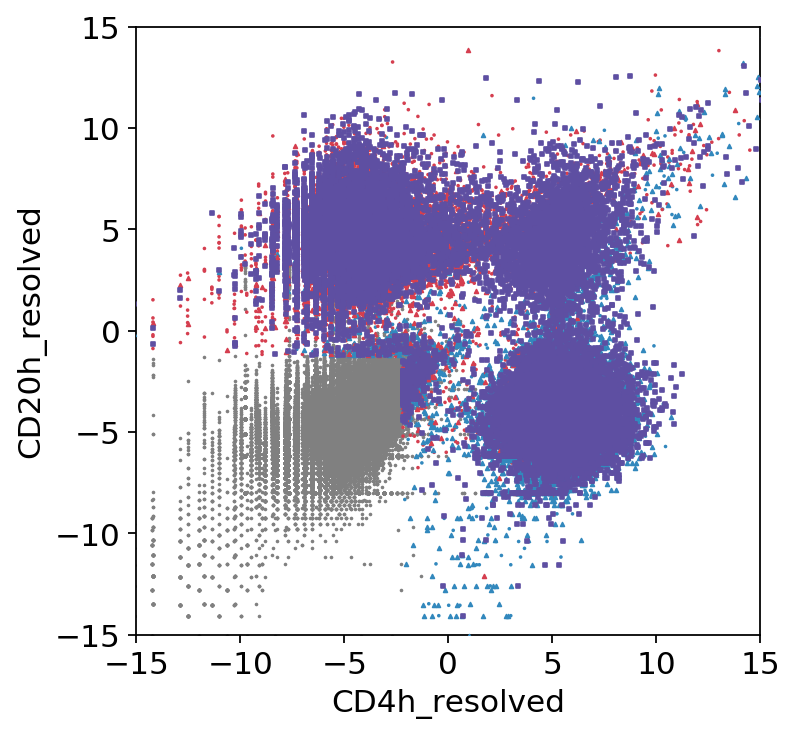

In [23]:
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin_resolved[(((df_fin_resolved['IND']=='donor0')&(df_fin_resolved['CT']=='CD4 T cells')&(df_fin_resolved['negatives']=='Singlet')) | ((df_fin_resolved['IND']=='donor0')&(df_fin_resolved['CT']=='CD4 T cells')&(df_fin_resolved['negatives']=='Doublet')))]
b=df_fin_resolved[(((df_fin_resolved['IND']=='donor0')&(df_fin_resolved['CT']=='B cells') &(df_fin_resolved['negatives']=='Singlet')) | ((df_fin_resolved['IND']=='donor0')&(df_fin_resolved['CT']=='B cells')&(df_fin_resolved['negatives']=='Doublet')))]
c=df_fin_resolved[(((df_fin_resolved['IND']=='donor1')&(df_fin_resolved['CT']=='CD4 T cells') &(df_fin_resolved['negatives']=='Singlet')) | ((df_fin_resolved['IND']=='donor1')&(df_fin_resolved['CT']=='CD4 T cells') &(df_fin_resolved['negatives']=='Doublet')))]
d=df_fin_resolved[(((df_fin_resolved['IND']=='donor1')&(df_fin_resolved['CT']=='B cells') &(df_fin_resolved['negatives']=='Singlet')) | ((df_fin_resolved['IND']=='donor1')&(df_fin_resolved['CT']=='B cells') &(df_fin_resolved['negatives']=='Doublet')))]
e = df_fin_resolved[(((df_fin_resolved['IND']=='donor0,donor1') & (df_fin_resolved['negatives']=='Singlet')) | ((df_fin_resolved['IND']=='donor0,donor1') & (df_fin_resolved['negatives']=='Doublet')))]
f=df_fin_resolved[df_fin_resolved['negatives']=='Negative' ]

s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=a, s=3, marker='.', facecolors='None', edgecolor='#3288BD', zorder=2)
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=b, s=3, marker='.', facecolors='None', edgecolor='#D53E4F', zorder=3)
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=c, s=3, marker='^', edgecolor=None, color='#3288BD', zorder=4)
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=d, s=3, marker='^', edgecolor=None, color='#D53E4F', zorder=5)
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=e, s=3, marker=',', edgecolor=None, color='#5E4FA2', zorder=6)
s=sns.scatterplot(x="CD4h_resolved",  y="CD20h_resolved", data=f, s=3, marker='.', edgecolor=None, color='grey', zorder=1)

plt.xlim(-15,15)
plt.ylim(-15,15)
s.grid(False)

f = s.get_figure()
f.savefig("200204_v1.1_100K_TB_h_resolved_clean_tx_group_plot.png")

In [50]:
df_fin_resolved_negative = df_fin_resolved[(df_fin_resolved['negatives'] == 'Singlet') | (df_fin_resolved['negatives'] == 'Doublet')]
df_fin_resolved_negative

,CD4h_resolved,CD20h_resolved,Pool,IND,CT,negatives
1,4.511879,-3.747341,Pool2,donor0,Doublets,Singlet
3,-4.501061,4.872602,Pool4,donor0,Doublets,Singlet
6,-3.778059,3.454040,Pool2,donor0,B cells,Singlet
11,-3.643357,3.188638,Pool2,donor0,B cells,Singlet
16,3.014072,-3.376845,Pool2,donor1,CD4 T cells,Singlet
...,...,...,...,...,...,...
209435,-3.003533,-1.068011,Pool1,donor1,CD4 T cells,Singlet
209436,4.599876,-3.650668,Pool2,donor1,CD4 T cells,Singlet
209439,6.879914,-4.501557,Pool5,donor1,CD4 T cells,Singlet
209441,5.387884,2.595918,Pool2,donor1,CD4 T cells,Doublet


In [61]:
df_fin_resolved_negative[df_fin_resolved_negative['CT']=='CD4 T cells'].shape[0] / df_fin_resolved_negative.shape[0]


0.37716359575656055

In [59]:
df_fin_resolved_negative[df_fin_resolved_negative['CT']=='B cells'].shape[0] / df_fin_resolved_negative.shape[0]

0.28344336059381875

In [53]:
df_fin_resolved_negative[df_fin_resolved_negative['CT']=='Doublets'].shape[0] / df_fin_resolved_negative.shape[0]

0.33939304364962064

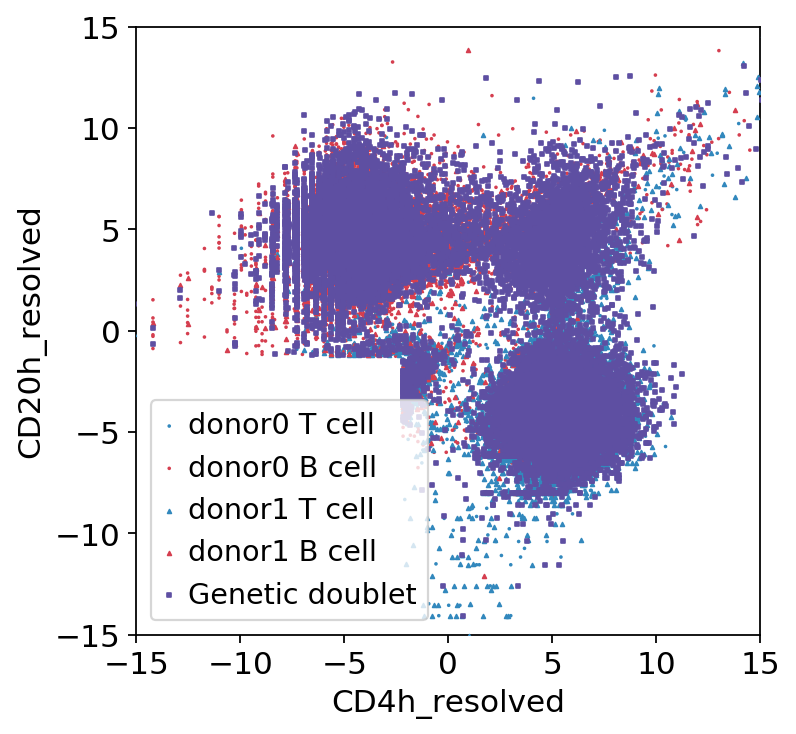

In [57]:
import seaborn as sns

plt.figure(figsize=(5,5))
a=df_fin_resolved_negative[(df_fin_resolved_negative['IND']=='donor0')&(df_fin_resolved_negative['CT']=='CD4 T cells')]
b=df_fin_resolved_negative[(df_fin_resolved_negative['IND']=='donor0')&(df_fin_resolved_negative['CT']=='B cells')]
c=df_fin_resolved_negative[(df_fin_resolved_negative['IND']=='donor1')&(df_fin_resolved_negative['CT']=='CD4 T cells')]
d=df_fin_resolved_negative[(df_fin_resolved_negative['IND']=='donor1')&(df_fin_resolved_negative['CT']=='B cells')]
e = df_fin_resolved_negative[df_fin_resolved_negative['IND']=='donor0,donor1']


s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=a, s=3, marker='.', facecolors='None', edgecolor='#3288BD', zorder=1, label="donor0 T cell")
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=b, s=3, marker='.', facecolors='None', edgecolor='#D53E4F', zorder=2, label="donor0 B cell")
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=c, s=3, marker='^', edgecolor=None, color='#3288BD', zorder=3, label="donor1 T cell")
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=d, s=3, marker='^', edgecolor=None, color='#D53E4F', zorder=4, label="donor1 B cell")
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=e, s=3, marker=',', edgecolor=None, color='#5E4FA2', zorder=5, label="Genetic doublet")
#s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=b, s=10, marker='^', edgecolor='#D53E4F', facecolors='None', zorder=1, label="donor1")
#s=sns.scatterplot(x="CD4h_resolved",  y="CD20h_resolved", data=f, s=10, marker='.', edgecolor=None, color='grey', zorder=5, label="Negative")


plt.xlim(-15,15)
plt.ylim(-15,15)
s.grid(False)

f = s.get_figure()
f.savefig("200204_v1.1_100K_TB_h_resolved_clean_tx_group_plot.png")

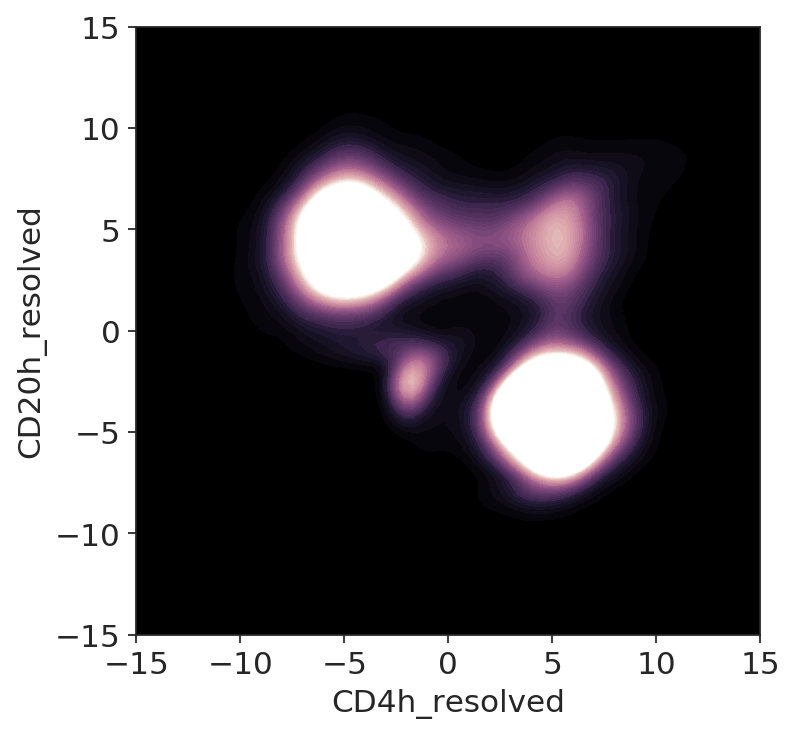

In [69]:
f, ax = plt.subplots(figsize=(5, 5))
cmap = sns.cubehelix_palette(as_cmap=True, dark=0, light=7, reverse=True)


g=sns.kdeplot(df_fin_resolved_negative.CD4h_resolved, df_fin_resolved_negative.CD20h_resolved, cmap=cmap, n_levels=300, shade=True);
plt.autoscale(True)
g.set(ylim=(-15,15))
g.set(xlim=(-15,15))
g.grid(False)

f = g.get_figure()
f.savefig("200204_v1.1_100K_TB_h_resolved_density_plot.png")

In [385]:
df_total_log_z_resolved = pd.read_table("191224_v1.1_1um_CD4_20_low_2batch_summary_resolved.txt", sep="\t")

/netapp/home/mtphobbes/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: read_table is deprecated, use read_csv instead.
  """Entry point for launching an IPython kernel.


In [47]:
df_gmm_log_resolved = pd.read_table("191224_v1.1_1um_CD4_20_high_2batch_summary_resolved.txt", sep="\t")

In [48]:
df_gmm_log_resolved.head()

,CD4h_resolved,CD20h_resolved,Identity,CT
0,4.248160,0.316728,donor1,CD4 T cells
1,-1.966288,-2.454797,donor1,CD4 T cells
2,-4.662562,-4.123538,donor0,CD4 T cells
3,1.134034,-4.358840,donor0,CD4 T cells
4,3.145348,-4.708078,donor1,CD4 T cells


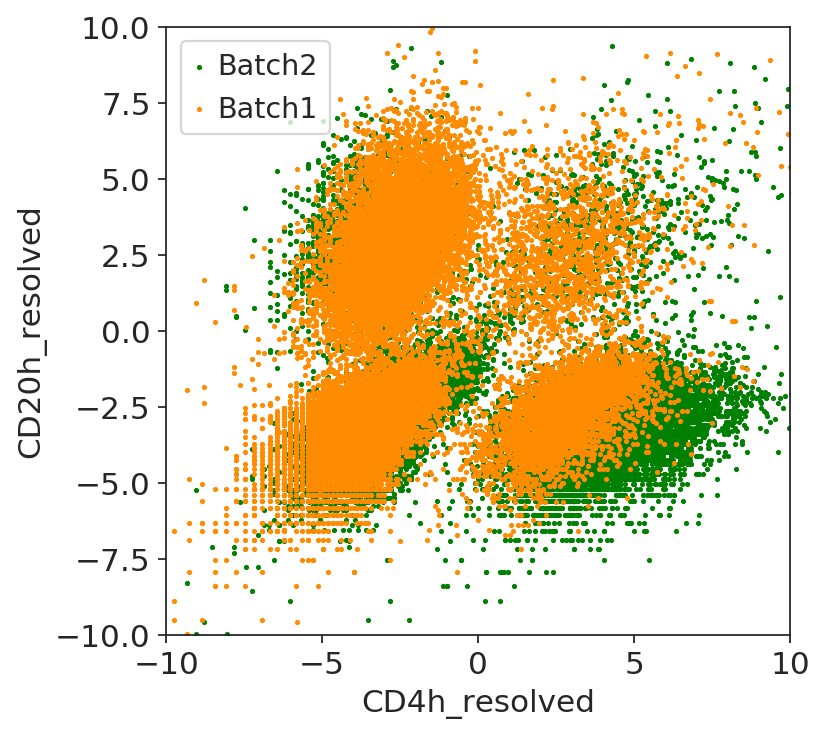

In [55]:
plt.figure(figsize=(5,5))
a=df_gmm_log_resolved[df_gmm_log_resolved['Identity']=='donor0']
b=df_gmm_log_resolved[df_gmm_log_resolved['Identity']=='donor1']
c=df_gmm_log_resolved[df_gmm_log_resolved['Identity']=='doublet']

s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=b, s=10, marker='.', edgecolor=None, color='green', zorder=1, label="Batch2")
#s=sns.scatterplot(x="CD4h_resolved",  y="CD20h_resolved", data=c, s=10, marker='.', edgecolor=None, color='#5E4FA2', zorder=3, label="Doublets")
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=a, s=10, marker='.', edgecolor=None, color='darkorange', zorder=2, label="Batch1")

plt.xlim(-10,10)
plt.ylim(-10,10)

f = s.get_figure()
f.savefig("191224_v1.1_50K_h_resolved_donor_group_plot.png")

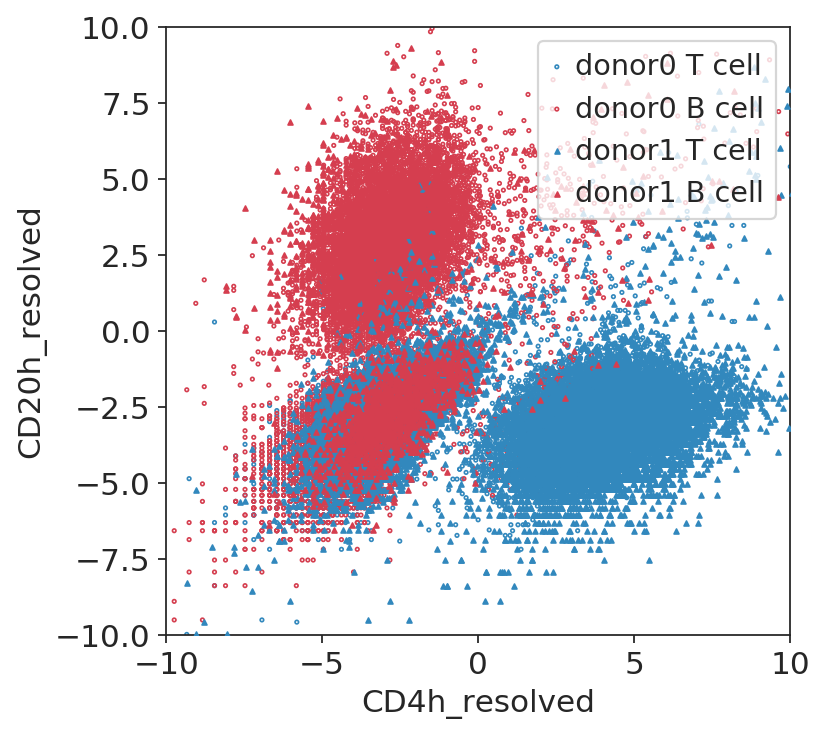

In [50]:
import pandas as pd
import seaborn as sns

plt.figure(figsize=(5,5))

sns.set_style("ticks")
a=df_gmm_log_resolved[(df_gmm_log_resolved['Identity']=='donor0')&(df_gmm_log_resolved['CT']=='CD4 T cells')]
b=df_gmm_log_resolved[(df_gmm_log_resolved['Identity']=='donor0')&(df_gmm_log_resolved['CT']=='B cells')]
c=df_gmm_log_resolved[(df_gmm_log_resolved['Identity']=='donor1')&(df_gmm_log_resolved['CT']=='CD4 T cells')]
d=df_gmm_log_resolved[(df_gmm_log_resolved['Identity']=='donor1')&(df_gmm_log_resolved['CT']=='B cells')]
e = df_gmm_log_resolved[df_gmm_log_resolved['Identity']=='donor0,donor1']


s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=a, s=10, marker='.', facecolors='None', edgecolor='#3288BD', zorder=1, label="donor0 T cell")
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=b, s=10, marker='.', facecolors='None', edgecolor='#D53E4F', zorder=2, label="donor0 B cell")
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=c, s=5, marker='^', edgecolor=None, color='#3288BD', zorder=3, label="donor1 T cell")
s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=d, s=5, marker='^', edgecolor=None, color='#D53E4F', zorder=4, label="donor1 B cell")
#s=sns.scatterplot(x="CD4h_resolved", y="CD20h_resolved", data=e, s=5, marker=',', edgecolor=None, color='#5E4FA2', zorder=5, label="Genetic doublet")

plt.xlim(-10,10)
plt.ylim(-10,10)

f = s.get_figure()
f.savefig("191224_v1.1_50K_h_resolved_donor_group_plot.png")

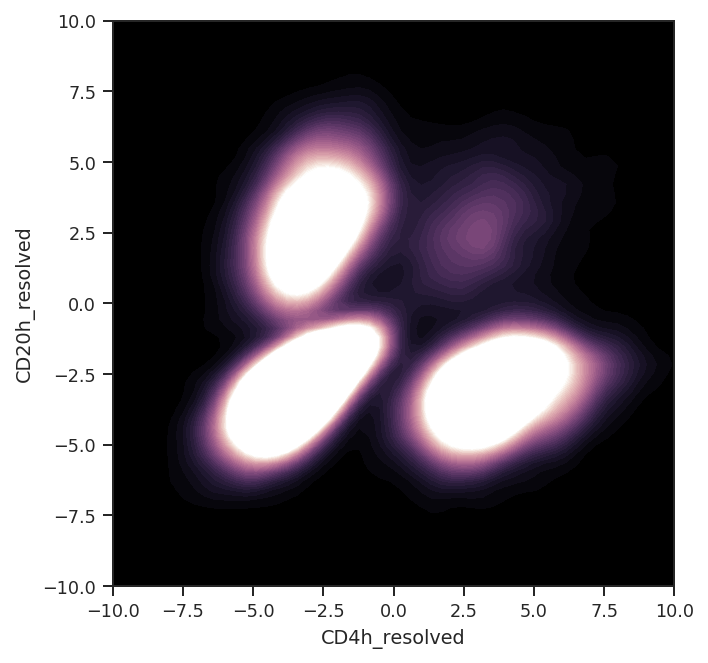

In [226]:
f, ax = plt.subplots(figsize=(5, 5))
cmap = sns.cubehelix_palette(as_cmap=True, dark=0, light=7, reverse=True)


g=sns.kdeplot(df_gmm_log_resolved.CD4h_resolved, df_gmm_log_resolved.CD20h_resolved, cmap=cmap, n_levels=300, shade=True);
plt.autoscale(True)
g.set(ylim=(-10,10))
g.set(xlim=(-10,10))
g.grid(False)

f = g.get_figure()
f.savefig("191224_v1.1_50K_h_resolved_density_plot.png")

In [60]:
df_log_z_resolved = pd.read_table("191224_v1.1_1um_CD4_20_low_2batch_summary_resolved.txt", sep="\t")

/netapp/home/mtphobbes/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: read_table is deprecated, use read_csv instead.
  """Entry point for launching an IPython kernel.


# Scatter plot using seaborn package here

In [31]:
import pandas as pd
import seaborn as sns

df_ind = cell_adata.obs['IND']

In [243]:
cell_adata

AnnData object with n_obs × n_vars = 16783 × 2905 
    obs: 'DROPTYPE', 'IND', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts'

In [244]:
# call here after you have mrnahv with leiden annotated with cell type (B, T)
cell_adata_mrnahv

AnnData object with n_obs × n_vars = 16783 × 2901 
    obs: 'DROPTYPE', 'IND', 'percent_mito', 'n_counts', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts'
    uns: 'neighbors', 'leiden', 'leiden_colors', 'DROPTYPE_colors', 'leiden-0_colors', 'DROPTYPE-0_colors', 'IND-0_colors'
    obsm: 'X_pca', 'X_umap'

In [245]:
df_celltype = cell_adata_mrnahv.obs['leiden']

In [246]:
df_CD4h_1 = cell_adata[:,'CD3barcode1'].to_df()
df_CD4h_2 = cell_adata[:,'CD3barcode2'].to_df()

df_CD20h_1 = cell_adata[:,'CD20barcode1'].to_df()
df_CD20h_2 = cell_adata[:,'CD20barcode2'].to_df()

df_CD4h_merged = df_CD4h_1.join(df_CD4h_2)
df_CD20h_merged = df_CD20h_1.join(df_CD20h_2)

df_CD4h_merged['CD4_h_merged'] = df_CD4h_merged.sum(axis=1)
df_CD20h_merged['CD20_m_merged'] = df_CD20h_merged.sum(axis=1)

df_CD4_20h_merged = df_CD4h_merged.join(df_CD20h_merged)
#type(cell_adata.obs['call'])
df_CD4_20h_merged = df_CD4_20h_merged.join(cell_adata.obs)

df_CD4_20h_merged.rename(columns = {'CD3barcode1':'CD4barcode1','CD3barcode2':'CD4barcode2'}, inplace = True)

In [247]:
df_CD4_20h_merged.head()

,CD4barcode1,CD4barcode2,CD4_h_merged,CD20barcode1,CD20barcode2,CD20_m_merged,DROPTYPE,IND,percent_mito,n_counts
AAACCCAAGACCGCCT-1,-0.637986,-0.330946,-0.968932,1.808486,0.707370,2.515857,DBL,"donor0,donor1",0.068064,3291.0
AAACCCAAGCAGAAAG-1,0.333345,-1.620865,-1.287520,1.476779,-1.614480,-0.137700,SNG,donor1,0.054556,6837.0
AAACCCAAGTAACGAT-1,-0.116467,2.845206,2.728739,0.743826,-0.044997,0.698829,SNG,donor0,0.141718,1129.0
AAACCCACACCGTCTT-1,1.668994,0.353719,2.022713,0.725244,-0.013834,0.711410,SNG,donor1,0.086374,1343.0
AAACCCACACGGCACT-1,0.480594,-0.852226,-0.371633,-1.410676,0.590422,-0.820254,DBL,"donor0,donor1",0.045088,5700.0


In [229]:
#df_call2 = df_CD4_20_h_merged['IND']
#df_identity2 = df_CD4_20_h_merged['identity']

#df_test_drop2 = df_CD4_20_h_merged.drop(['IND','DROPTYPE','percent_mito'],axis=1)

#df_log1p=df_test_drop2.apply(np.log1p)

#log_znorm_df=(df_log1p-df_log1p.mean())/df_log1p.std()

In [232]:
# adding cell type <-> barcode assignment here
#df_test_drop2.head()

,CD3barcode1,CD3barcode2,CD4_h_merged,CD20barcode1,CD20barcode2,CD20_h_merged,n_counts
AAACCCAAGACCGCCT-1,-0.637986,-0.330946,-0.968932,1.808486,0.707370,2.515857,3291.0
AAACCCAAGCAGAAAG-1,0.333345,-1.620865,-1.287520,1.476779,-1.614480,-0.137700,6837.0
AAACCCAAGTAACGAT-1,-0.116467,2.845206,2.728739,0.743826,-0.044997,0.698829,1129.0
AAACCCACACCGTCTT-1,1.668994,0.353719,2.022713,0.725244,-0.013834,0.711410,1343.0
AAACCCACACGGCACT-1,0.480594,-0.852226,-0.371633,-1.410676,0.590422,-0.820254,5700.0


In [ ]:
#replace_identity_column = df_test_fin_log_z_adt2['identity'].replace({'CD29h-barcode1': 'batch1', 'CD29h-barcode2': 'batch2','CD29m-barcode1': 'batch1', 'CD29m-barcode2': 'batch2',
                         'CD29h-barcode1_CD29m-barcode1':'batch1','CD29h-barcode2_CD29m-barcode2':'batch2' })

In [ ]:
#df_test_fin_log_z_adt2['batch'] = replace_identity_column
df_test_fin_log_z_adt2.to_csv("191205_v1.1_1um_CD29_2batch_log_zscore_add_column_summary_matrix.csv")

# UMAP for finding the cell type info

In [29]:
cell_adata.var

,gene_ids,feature_types,genome,n_counts
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,53.0
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,5.0
AL627309.4,ENSG00000241599,Gene Expression,GRCh38,1.0
AL669831.2,ENSG00000229905,Gene Expression,GRCh38,4.0
AL669831.5,ENSG00000237491,Gene Expression,GRCh38,1955.0
...,...,...,...,...
CD20barcode1,Ab1CD20,Antibody Capture,,3874208.0
CD20barcode2,Ab2CD20,Antibody Capture,,3984194.0
CD20barcode3,Ab3CD20,Antibody Capture,,612178.0
CD20barcode4,Ab4CD20,Antibody Capture,,3476004.0


In [53]:
cell_adata2 = cell_adata[:,cell_adata.var.index[:-10]]

In [54]:
cell_adata2.var

,gene_ids,feature_types,genome,n_counts
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,53.0
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,5.0
AL627309.4,ENSG00000241599,Gene Expression,GRCh38,1.0
AL669831.2,ENSG00000229905,Gene Expression,GRCh38,4.0
AL669831.5,ENSG00000237491,Gene Expression,GRCh38,1955.0
...,...,...,...,...
AL354822.1,ENSG00000278384,Gene Expression,GRCh38,162.0
AC004556.1,ENSG00000276345,Gene Expression,GRCh38,1021.0
AC233755.2,ENSG00000277856,Gene Expression,GRCh38,25.0
AC233755.1,ENSG00000275063,Gene Expression,GRCh38,75.0


In [55]:
sc.pp.normalize_per_cell(cell_adata2, counts_per_cell_after=1e4)

normalizing by total count per cell


Trying to set attribute `.obs` of view, copying.


    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [56]:
sc.pp.log1p(cell_adata2)

Extract out highly variable genes, but don't subset just yet.

In [57]:
hv_out = sc.pp.highly_variable_genes(cell_adata2, inplace=False)

extracting highly variable genes
    Gene indices [12097] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:02)


In [58]:
cell_adata2.var.tail(10)

,gene_ids,feature_types,genome,n_counts
AC145212.1,ENSG00000277400,Gene Expression,GRCh38,5.0
MAFIP,ENSG00000274847,Gene Expression,GRCh38,85.0
AC011043.1,ENSG00000276256,Gene Expression,GRCh38,7.0
AL592183.1,ENSG00000273748,Gene Expression,GRCh38,2051.0
AC007325.4,ENSG00000278817,Gene Expression,GRCh38,54.0
AL354822.1,ENSG00000278384,Gene Expression,GRCh38,162.0
AC004556.1,ENSG00000276345,Gene Expression,GRCh38,1021.0
AC233755.2,ENSG00000277856,Gene Expression,GRCh38,25.0
AC233755.1,ENSG00000275063,Gene Expression,GRCh38,75.0
AC240274.1,ENSG00000271254,Gene Expression,GRCh38,437.0


In [59]:
keep_genes = cell_adata2.var_names[hv_out['highly_variable']].tolist()
#proteins = ['CD4barcode1', 'CD4barcode2', 'CD20barcode1', 'CD20barcode2']
# proteins = ['CD4-BC1', 'CD4-BC2', 'CD14-BC1', 'CD14-BC2']

Are our proteins highly variable?

In [60]:
#[i in keep_genes for i in proteins]

Regress out unwanted variation.

In [61]:
cell_adata2 = cell_adata2[:,keep_genes].copy()

In [ ]:
#sc.pp.regress_out(cell_adata,['percent_mito','n_counts'],n_jobs=40)

regressing out ['percent_mito', 'n_counts']
    sparse input is densified and may lead to high memory use


... storing 'DROPTYPE' as categorical
... storing 'IND' as categorical
... storing 'gene_ids' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


In [62]:
sc.pp.scale(cell_adata2, max_value=10)

    ... scale_data: as `zero_center=True`, sparse input is densified and may lead to large memory consumption.
    ... clipping at max_value 10


Cluster on just the mRNA and then we'll add our protein markers back later.

In [63]:
cell_adata_mrnahv = cell_adata2[:,keep_genes].copy()
#cell_adata_p = cell_adata[:,proteins].copy()

Begin clustering and dimensionality reduction.

In [64]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(cell_adata_mrnahv,n_neighbors=10) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
    computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA with n_comps = 50
    finished (0:00:15)
    computed neighbors (0:00:28)
    computed connectivities (0:00:03)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:32)


In [65]:
# resolution to 0.2 for small number of clusters 
sc.tl.leiden(cell_adata_mrnahv,resolution=0.2)

running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:14)


In [66]:
sc.tl.umap(cell_adata_mrnahv)

computing UMAP


/home/bhwang1/anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:41)


... storing 'DROPTYPE' as categorical
... storing 'IND' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
/home/bhwang1/anaconda3/lib/python3.7/site-packages/matplotlib/axes/_axes.py:4204: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  (isinstance(c, collections.Iterable) and


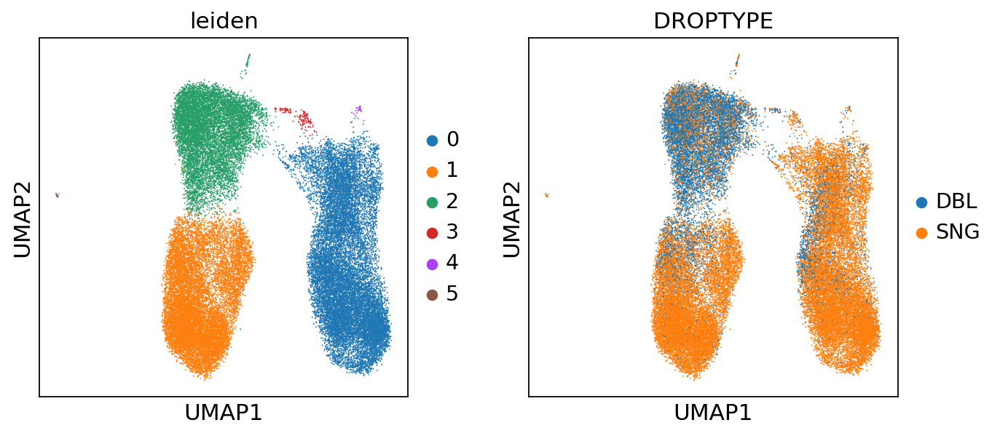

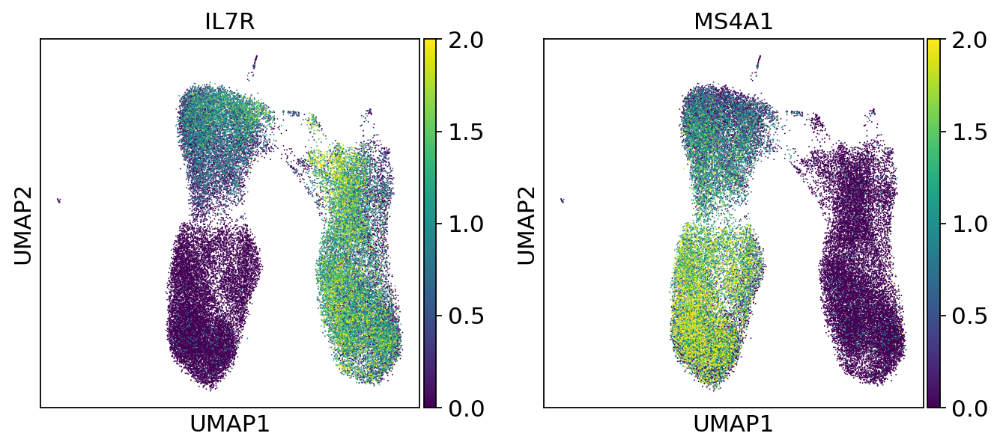

In [67]:
sc.pl.umap(cell_adata_mrnahv,color=['leiden','DROPTYPE'])
sc.pl.umap(cell_adata_mrnahv, color=['IL7R', 'MS4A1'], use_raw=False, vmin=0, vmax=2)
#sc.pl.umap(cell_adata, color=['leiden', 'IL7R', 'MS4A1'])

In [68]:
new_cluster_names = ['CD4_T_cells','B_cells', 'Doublets','x','y','z']
cell_adata_mrnahv.rename_categories('leiden', new_cluster_names)

old_to_new = dict(
  CD4_T_cells='CD4 T cells',
    B_cells='B cells',
    Doublets='Doublets',
     x='CD4 T cells',
     y='CD4 T cells',
    z='Doublets'
)


cell_adata_mrnahv.obs['cell_type'] = (
    cell_adata_mrnahv.obs['leiden']
    .map(old_to_new)
    .astype('category')
)


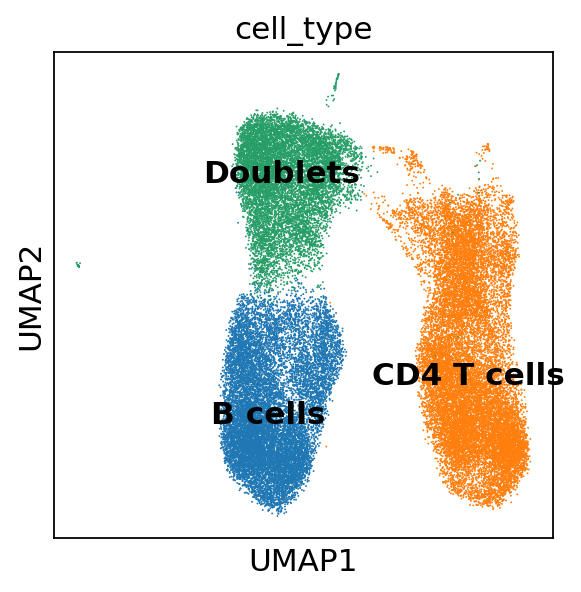

In [69]:
sc.pl.umap(cell_adata_mrnahv, color='cell_type', legend_loc='on data')

In [70]:
df_cell_type = cell_adata_mrnahv.obs['cell_type']

In [71]:
cell_adata_mrnahv

AnnData object with n_obs × n_vars = 41889 × 1679 
    obs: 'DROPTYPE', 'IND', 'percent_mito', 'n_counts', 'leiden', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts'
    uns: 'log1p', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'DROPTYPE_colors', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap'

Concatenate back the proteins with the mRNA.

In [78]:
#cell_adata_mrnahv.X = csr_matrix(cell_adata_mrnahv.X) # need this to concatenate
#cell_adata_comb = cell_adata_mrnahv.T.concatenate(cell_adata_p.T).T.copy()# concatenate along the variables axis

In [74]:
ctype_gmm_df = gmm_df.join(df_cell_type)

In [77]:
a=ctype_gmm_df['CD4_h_merged'].to_frame()
b=ctype_gmm_df['CD20_h_merged'].to_frame()
#c=ctype_gmm_df['CD4barcode3'].to_frame()
#d=ctype_gmm_df['CD4barcode4'].to_frame()
#e=ctype_gmm_df['CD4barcode5'].to_frame()
#f=ctype_gmm_df['CD20barcode1'].to_frame()
#g=ctype_gmm_df['CD20barcode2'].to_frame()
#h=ctype_gmm_df['CD20barcode3'].to_frame()
#i=ctype_gmm_df['CD20barcode4'].to_frame()
#j=ctype_gmm_df['CD20barcode5'].to_frame()

pgmm = a.join([b])
#pgmm.columns=['CD4barcode1','CD4barcode2','CD20barcode1','CD20barcode2']
pgmm_adata = sc.AnnData(pgmm)

In [78]:
pgmm.head()

,CD4_h_merged,CD20_h_merged
AAACCCAAGAATCGTA-1,2.833832,2.372427
AAACCCAAGACCGCCT-1,-3.240815,1.499456
AAACCCAAGACCTGGA-1,-3.184514,1.187264
AAACCCAAGCGACTAG-1,1.058676,-2.860141
AAACCCAAGCGTGTTT-1,3.614838,-2.589002


# concatenate back the proteins with GMM normalized ADT counts

In [79]:
cell_adata_mrnahv.X = csr_matrix(cell_adata_mrnahv.X) 
cell_adata_comb = cell_adata_mrnahv.T.concatenate(pgmm_adata.T).T.copy()

Keep all the nice unstructured (uns) data and multi-D annotations of observations (obsm).

In [80]:
cell_adata_comb.uns = cell_adata_mrnahv.uns # copy over the umap and leiden data
cell_adata_comb.obsm = cell_adata_mrnahv.obsm # copy over the umap and leiden data

In [81]:
cell_adata_comb.obs.columns

Index(['DROPTYPE-0', 'IND-0', 'percent_mito-0', 'n_counts-0', 'leiden-0',
       'cell_type-0'],
      dtype='object')

Do some cleanup.

In [81]:
# cell_adata_comb.obs.drop(['DROPTYPE-1','IND-1'],axis=1,inplace=True) # clean up the obs
#cell_adata_comb.obs.columns = ['DROPTYPE-0','IND-0','percent_mito','n_counts','leiden-0','DROPTYPE-1', 'IND-1'] # clean up the obs

In [82]:
#cell_adata_comb.var_names = cell_adata_mrnahv.var_names.tolist() + cell_adata_p.var_names.tolist() # clean up those var names

In [83]:
cell_adata_comb.var

,batch,feature_types,gene_ids,genome,n_counts
HES4-0,0,Gene Expression,ENSG00000188290,GRCh38,327.0
ISG15-0,0,Gene Expression,ENSG00000187608,GRCh38,6862.0
TNFRSF18-0,0,Gene Expression,ENSG00000186891,GRCh38,1699.0
TNFRSF4-0,0,Gene Expression,ENSG00000186827,GRCh38,1461.0
CDK11A-0,0,Gene Expression,ENSG00000008128,GRCh38,8825.0
...,...,...,...,...,...
PCNT-0,0,Gene Expression,ENSG00000160299,GRCh38,2588.0
PRMT2-0,0,Gene Expression,ENSG00000160310,GRCh38,21350.0
AC240274.1-0,0,Gene Expression,ENSG00000271254,GRCh38,437.0
CD4_h_merged-1,1,nan,nan,nan,NaN


Visualize!

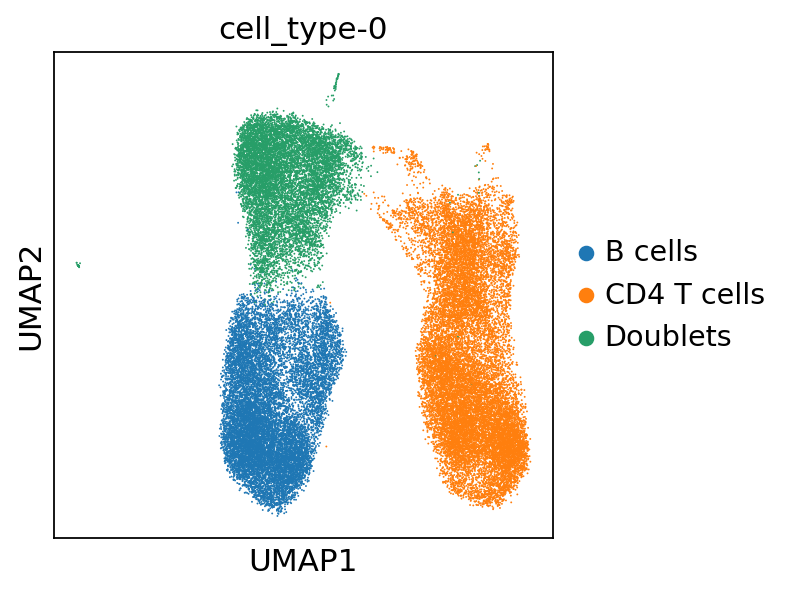

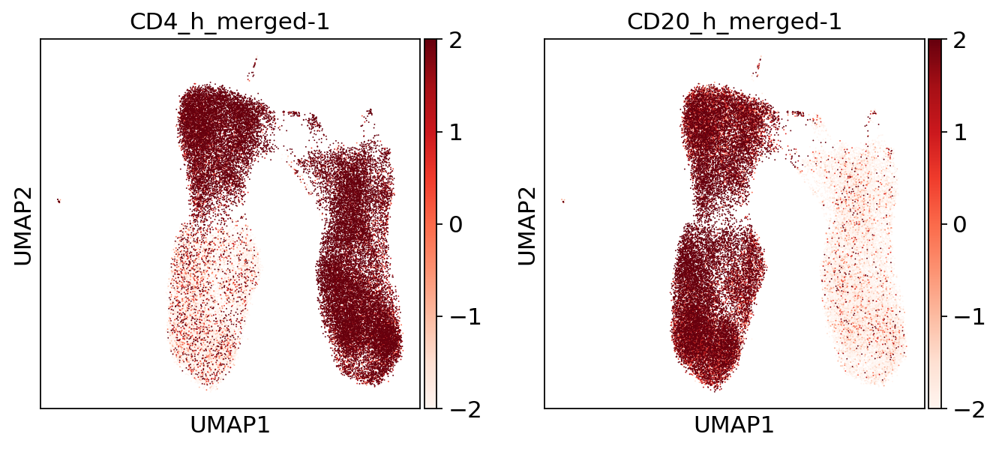

In [84]:
import matplotlib as mpl
sc.pl.umap(cell_adata_comb,color='cell_type-0', save="200204_low_h_umap_donor.png")
sc.pl.umap(cell_adata_comb,color=['CD4_h_merged-1','CD20_h_merged-1'], vmin=-2, vmax=2,palette="Set2", color_map=mpl.cm.Reds, save="200204_low_h_umap_merged_adt.png")
#sc.pl.umap(cell_adata_comb,color='DROPTYPE-0')
#sc.pl.umap(cell_adata_comb,color='percent_mito-0')
#sc.pl.umap(cell_adata_comb,color='n_counts-0')
#sc.pl.umap(cell_adata_comb,color='IND-0')

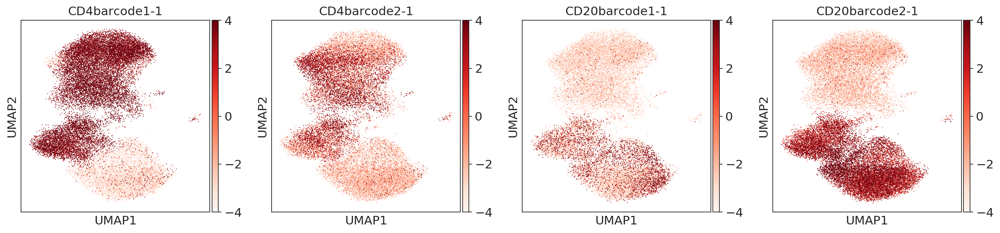

In [62]:
import matplotlib as mpl
sc.pl.umap(cell_adata_comb,color=['CD4barcode1-1','CD4barcode2-1', 'CD20barcode1-1', 'CD20barcode2-1' ], vmin=-4, vmax=4, palette="Set2", color_map=mpl.cm.Reds)

In [43]:
cell_adata_comb_donor0 = cell_adata_comb[cell_adata_comb.obs['IND-0']=='donor0']
cell_adata_comb_donor1 = cell_adata_comb[cell_adata_comb.obs['IND-0']=='donor1']

In [183]:
cd3_1_donor1 = cell_adata_comb_donor1[:,'CD3barcode1'].X
cd20_1_donor1 = cell_adata_comb_donor1[:,'CD20barcode1'].X
cd3_1_donor0 = cell_adata_comb_donor0[:,'CD3barcode2'].X
cd20_1_donor0 = cell_adata_comb_donor0[:,'CD20barcode2'].X

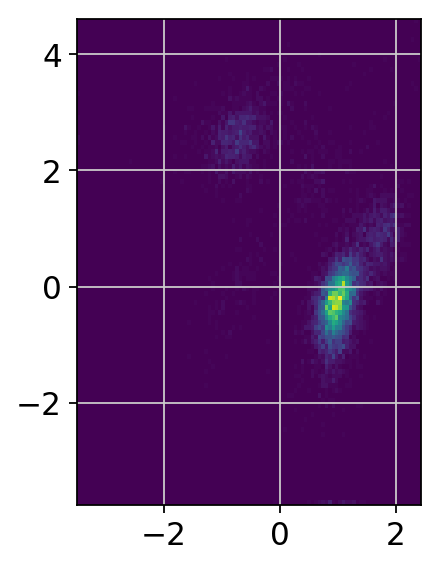

In [184]:
import numpy as np
import numpy.random
import matplotlib.pyplot as plt
# Generate some test data
x = cd3_1_donor1
y = cd20_1_donor1
heatmap, xedges, yedges = np.histogram2d(x, y, bins=100)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
plt.clf()
plt.imshow(heatmap.T, extent=extent, origin='lower')
plt.show()

In [50]:
sc.tl.embedding_density(cell_adata_comb_donor1, basis='umap', groupby=None, key_added='density', components=None)
sc.tl.embedding_density(cell_adata_comb_donor0, basis='umap', groupby=None, key_added='density', components=None)

computing density on 'umap'
--> added
    'density', densities (adata.obs)
    'density_params', parameter (adata.uns)
computing density on 'umap'
--> added
    'density', densities (adata.obs)
    'density_params', parameter (adata.uns)


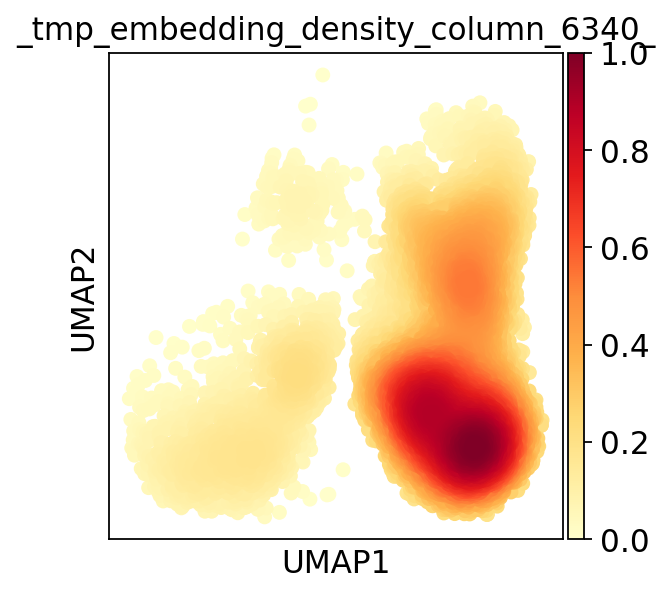

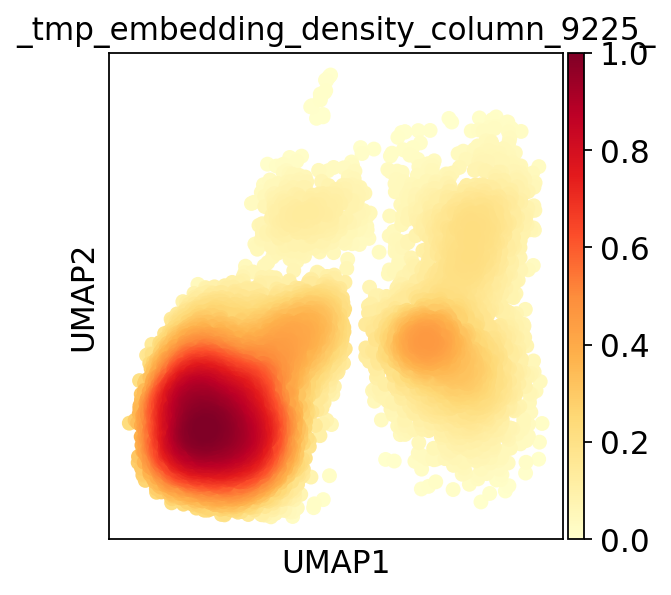

In [51]:
sc.pl.embedding_density(cell_adata_comb_donor1, basis='umap', key='density', group='all', color_map='YlOrRd', bg_dotsize=80, fg_dotsize=180, vmax=1, vmin=0, ncols=4, hspace=0.25, wspace=None, title=None, show=None, save=None, ax=None, return_fig=None)
sc.pl.embedding_density(cell_adata_comb_donor0, basis='umap', key='density', group='all', color_map='YlOrRd', bg_dotsize=80, fg_dotsize=180, vmax=1, vmin=0, ncols=4, hspace=0.25, wspace=None, title=None, show=None, save=None, ax=None, return_fig=None)

In [85]:
#plt.hist([cell_adata_comb_donor1[:,'CD20barcode1'].X], bins = 200, histtype='barstacked')

In [86]:
#plt.hist([cell_adata_comb_donor0[:,'CD20barcode2'].X], bins = 200, histtype='barstacked')

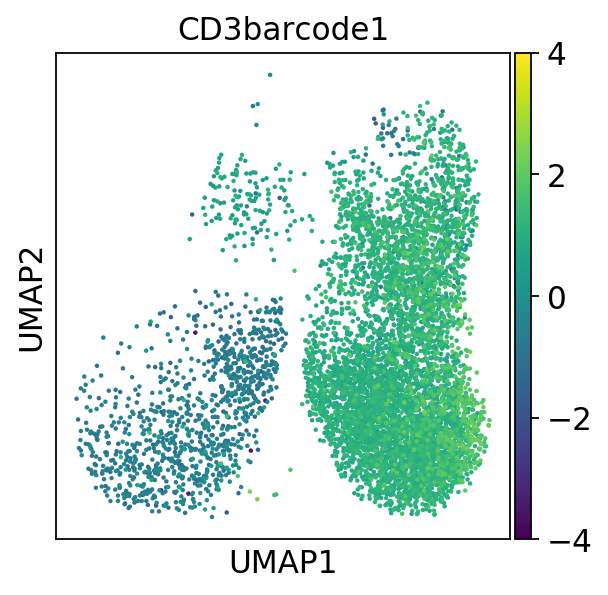

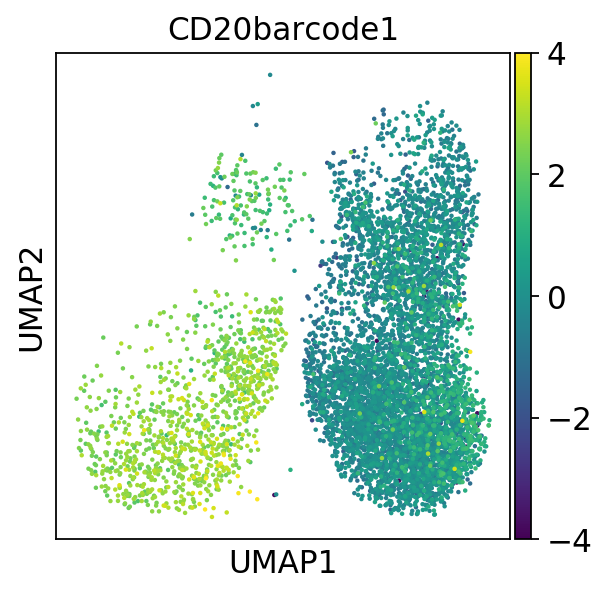

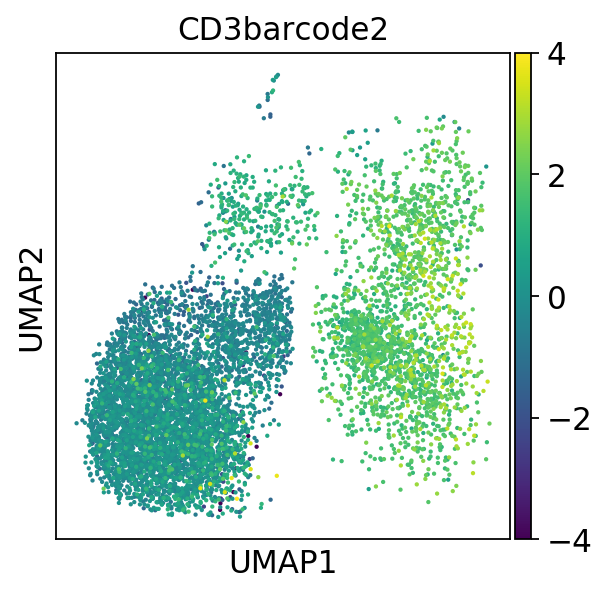

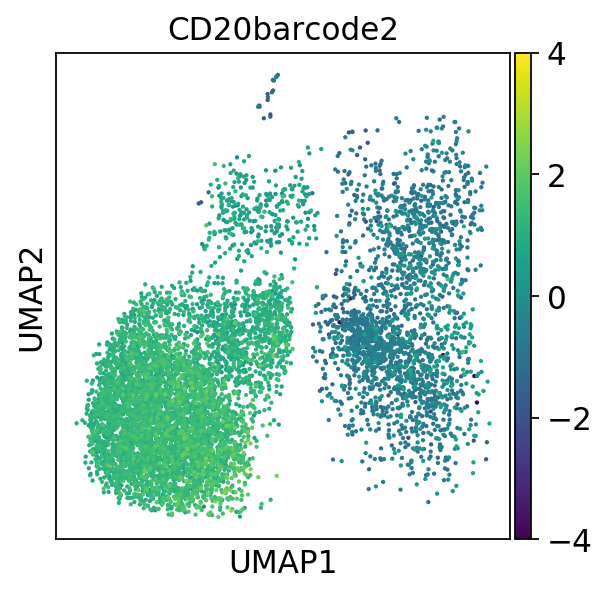

In [58]:
sc.pl.umap(cell_adata_comb_donor1,color='CD3barcode1', vmin=-4, vmax=4)
sc.pl.umap(cell_adata_comb_donor1,color='CD20barcode1', vmin=-4, vmax=4)
sc.pl.umap(cell_adata_comb_donor0,color='CD3barcode2', vmin=-4, vmax=4)
sc.pl.umap(cell_adata_comb_donor0,color='CD20barcode2', vmin=-4, vmax=4)

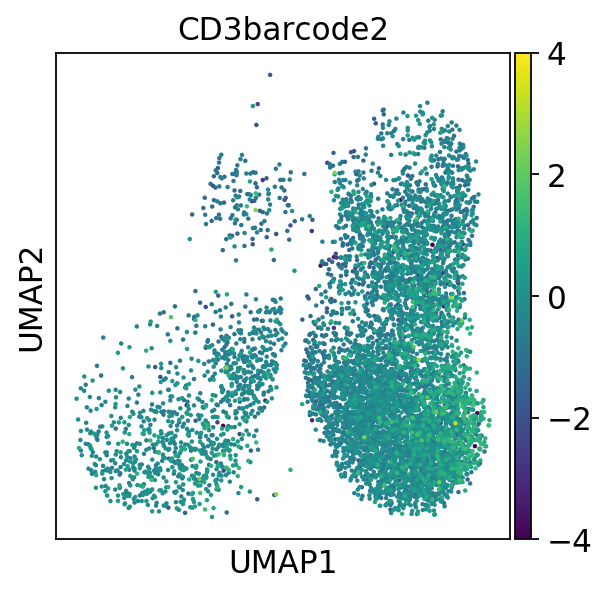

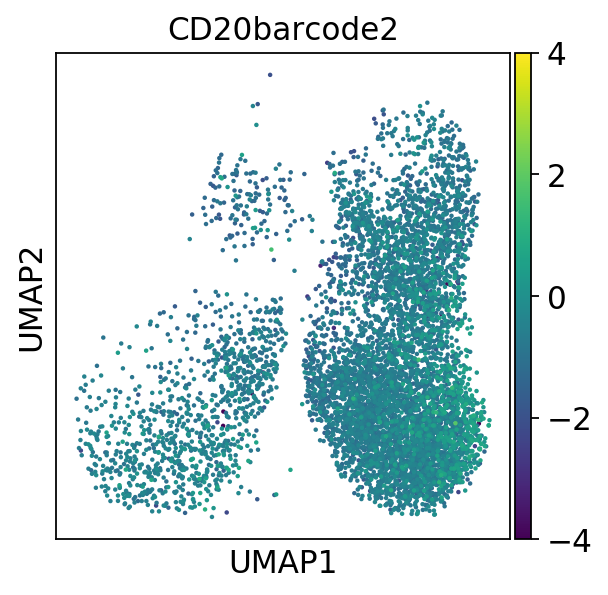

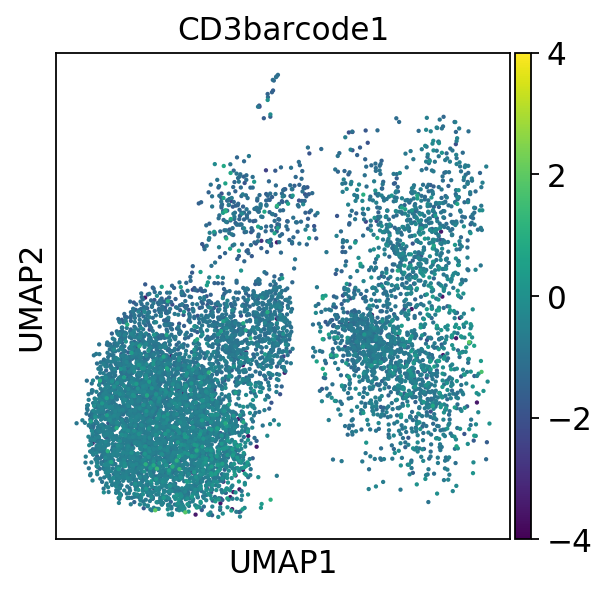

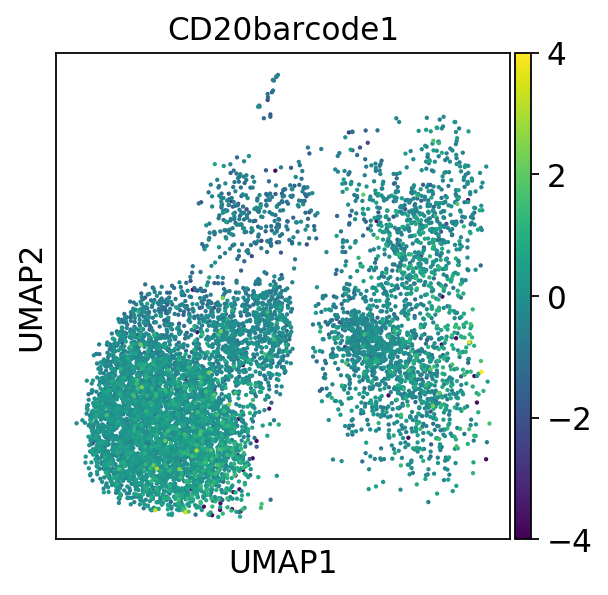

In [59]:
sc.pl.umap(cell_adata_comb_donor1,color='CD3barcode2', vmin=-4, vmax=4)
sc.pl.umap(cell_adata_comb_donor1,color='CD20barcode2', vmin=-4, vmax=4)
sc.pl.umap(cell_adata_comb_donor0,color='CD3barcode1', vmin=-4, vmax=4)
sc.pl.umap(cell_adata_comb_donor0,color='CD20barcode1', vmin=-4, vmax=4)

Cluster based on only two individual

In [64]:
cell_adata_comb_two =cell_adata_comb_sng[(cell_adata_comb_sng.obs['IND']=='IGTB1921')|(cell_adata_comb_sng.obs['IND']=='IGTB1542')]
cell_adata_comb_two_TB = cell_adata_comb_two[(cell_adata_comb_two.obs['leiden-0']=='0')|(cell_adata_comb_two.obs['leiden-0']=='3')|(cell_adata_comb_two.obs['leiden-0']=='4')]

In [65]:
cell_adata_comb_two_TB

View of AnnData object with n_obs × n_vars = 1867 × 1417 
    obs: 'DROPTYPE', 'IND', 'percent_mito', 'n_counts', 'leiden-0'
    var: 'batch', 'feature_types', 'gene_ids', 'genome', 'n_counts'
    uns: 'neighbors', 'leiden'
    obsm: 'X_pca', 'X_umap'

Cluster again with these subset cells (T, B cells for two donors)

In [73]:
sc.pp.neighbors(cell_adata_comb_two_TB,n_neighbors=10)

computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:00)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)


In [74]:
sc.tl.leiden(cell_adata_comb_two_TB,resolution=0.7)

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [75]:
sc.tl.umap(cell_adata_comb_two_TB,min_dist=2,gamma=50)

computing UMAP
	completed  0  /  500 epochs


/netapp/home/mtphobbes/anaconda3/lib/python3.7/site-packages/umap/umap_.py:1052: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))
/netapp/home/mtphobbes/anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


subset the object by donor here!

In [84]:
cell_adata_comb_two_TB_1542 =cell_adata_comb_two_TB[cell_adata_comb_two_TB.obs['IND']=='IGTB1542']
cell_adata_comb_two_TB_1921 =cell_adata_comb_two_TB[cell_adata_comb_two_TB.obs['IND']=='IGTB1921']

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


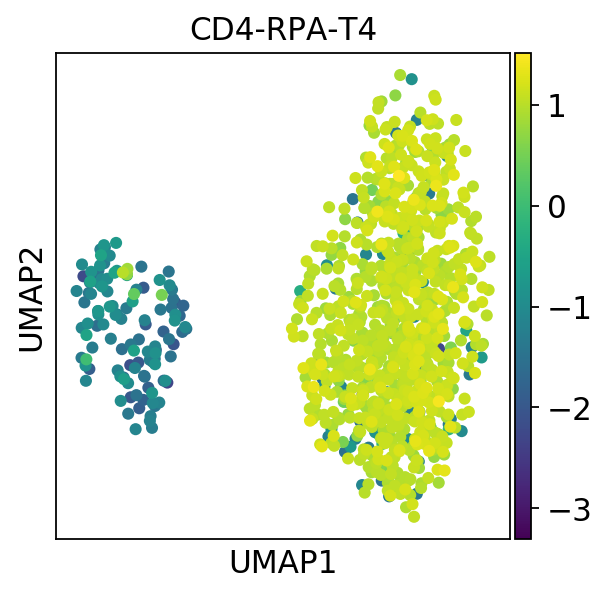

In [85]:
sc.pl.umap(cell_adata_comb_two_TB_1542,color=['CD4-RPA-T4'])

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


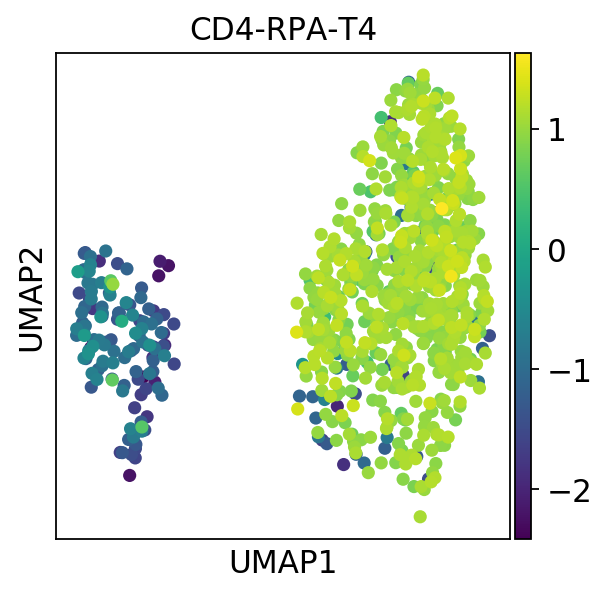

In [86]:
sc.pl.umap(cell_adata_comb_two_TB_1921,color=['CD4-RPA-T4'])

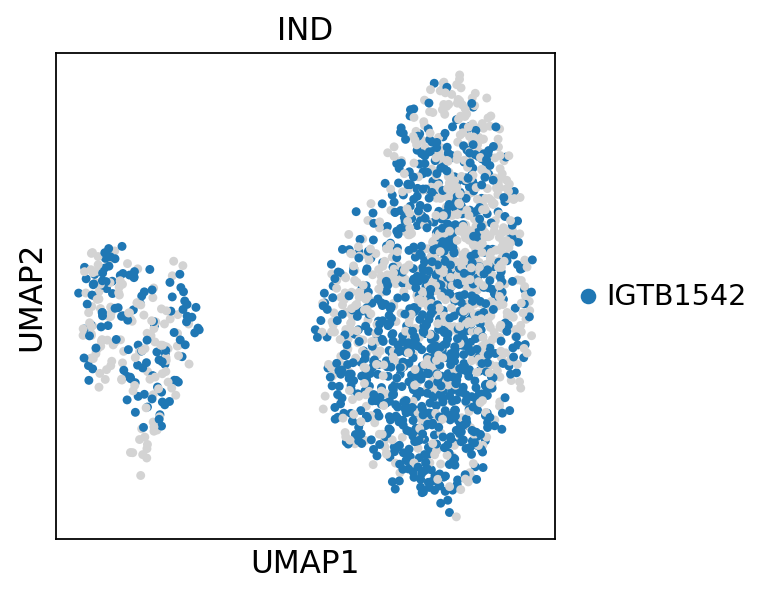

In [81]:
sc.pl.umap(cell_adata_comb_two_TB,color=['IND'], groups=['IGTB1542'])

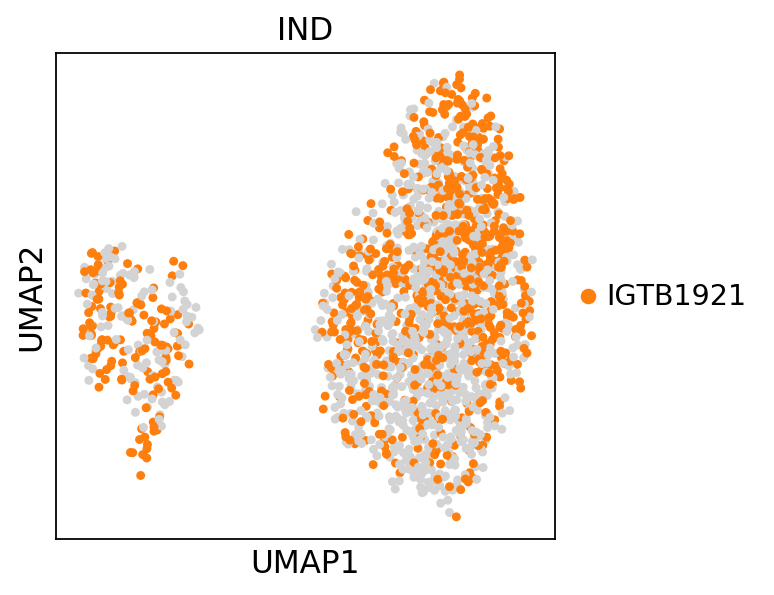

In [82]:
sc.pl.umap(cell_adata_comb_two_TB,color=['IND'], groups=['IGTB1921'])

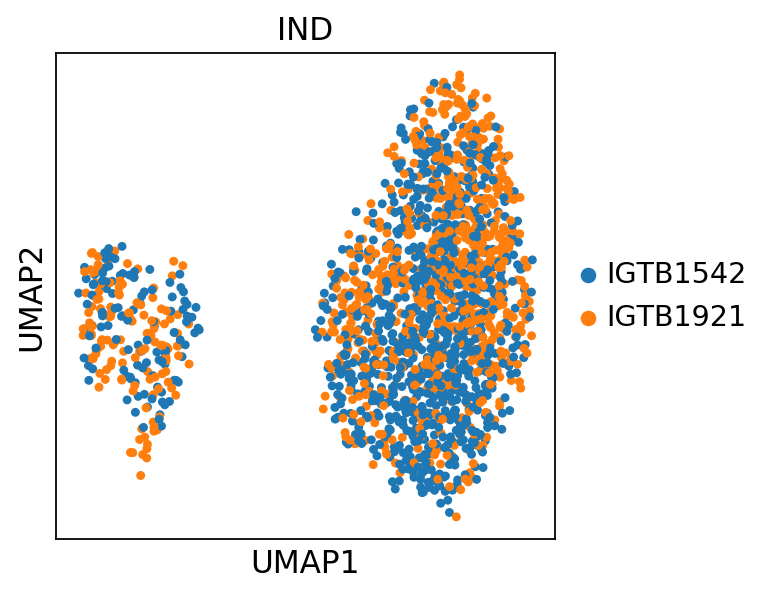

In [79]:
sc.pl.umap(cell_adata_comb_two_TB,color='IND')

In [45]:
cell_adata_mrnahv_two_TB.X = csr_matrix(cell_adata_mrnahv_two_TB.X) # need this to concatenate
cell_adata_comb_two_TB = cell_adata_mrnahv_two_TB.T.concatenate(cell_adata_p.T).T.copy()

Trying to set attribute `.X` of view, making a copy.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


ValueError: You're trying to transpose a view of an `AnnData`, which is currently not implemented. Call `.copy()` before transposing.

In [113]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(cell_adata_mrnahv_two,n_neighbors=10) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:00)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)


In [114]:
sc.tl.leiden(cell_adata_mrnahv_two,resolution=0.7)

running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [115]:
sc.tl.umap(cell_adata_mrnahv_two,min_dist=2,gamma=50)

computing UMAP
	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed 

/netapp/home/mtphobbes/anaconda3/lib/python3.7/site-packages/umap/umap_.py:1052: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))
/netapp/home/mtphobbes/anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


 100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


In [117]:
cell_adata_mrnahv_two.X = csr_matrix(cell_adata_mrnahv_two.X) # need this to concatenate
cell_adata_two_comb = cell_adata_mrnahv_two.T.concatenate(cell_adata_p.T).T.copy()# concatenate along the variables axis

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Or pass `index_unique!=None` to `.concatenate`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [120]:
cell_adata_two_comb.uns = cell_adata_mrnahv_two.uns # copy over the umap and leiden data
cell_adata_two_comb.obsm = cell_adata_mrnahv_two.obsm # copy over the umap and leiden data

In [126]:
cell_adata_two_comb.obs

,DROPTYPE-0,IND-0,percent_mito,n_counts,leiden-0,DROPTYPE-1,IND-1
AAACCTGAGAGGTAGA-1,SNG,IGTB1921,0.014409,3470,3,SNG,IGTB1921
AAACCTGAGCCACTAT-1,SNG,IGTB1921,0.019268,3633,0,SNG,IGTB1921
AAACCTGCAGGAACGT-1,SNG,IGTB1921,0.019426,2368,0,SNG,IGTB1921
AAACCTGCATCCCACT-1,SNG,IGTB1921,0.036643,2729,5,SNG,IGTB1921
AAACCTGGTATATGAG-1,SNG,IGTB1921,0.009312,3544,0,SNG,IGTB1921
AAACCTGGTGACAAAT-1,SNG,IGTB1542,0.017643,3174,0,SNG,IGTB1542
AAACCTGGTTCTGGTA-1,SNG,IGTB1542,0.013936,4449,3,SNG,IGTB1542
AAACCTGTCCTAAGTG-1,SNG,IGTB1542,0.021837,2885,0,SNG,IGTB1542
AAACCTGTCGTAGATC-1,SNG,IGTB1542,0.044613,3295,7,SNG,IGTB1542
AAACCTGTCTCCGGTT-1,SNG,IGTB1921,0.009603,3124,0,SNG,IGTB1921


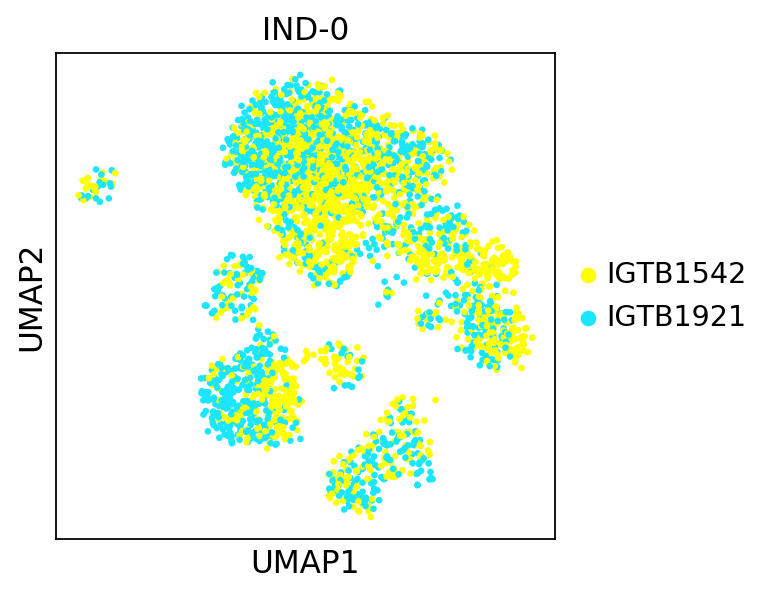

In [139]:
sc.pl.umap(cell_adata_two_comb,color='IND-0')

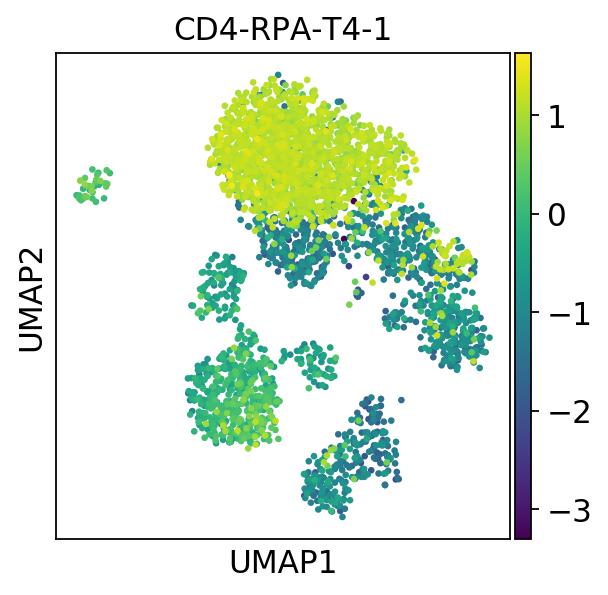

In [125]:
sc.pl.umap(cell_adata_two_comb,color='CD4-RPA-T4-1')

In [129]:
cell_adata_two_comb_sng_1921 = cell_adata_two_comb[cell_adata_two_comb.obs['IND-0']=='IGTB1921']
cell_adata_two_comb_sng_1542 = cell_adata_two_comb[cell_adata_two_comb.obs['IND-0']=='IGTB1542']

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


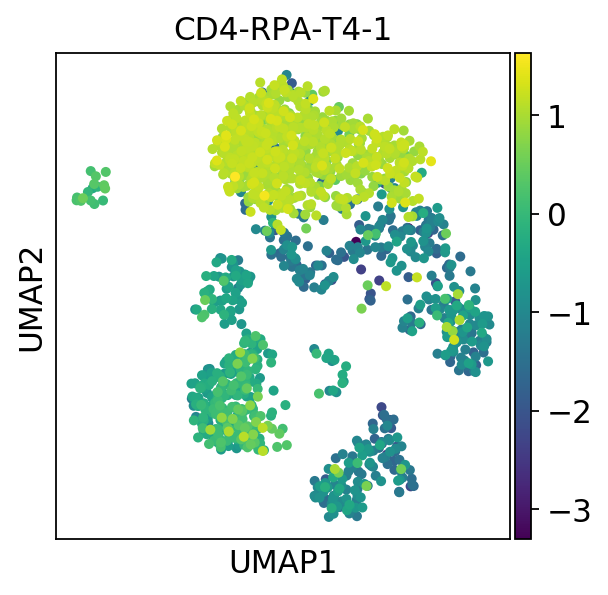

In [130]:
sc.pl.umap(cell_adata_two_comb_sng_1921,color='CD4-RPA-T4-1')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


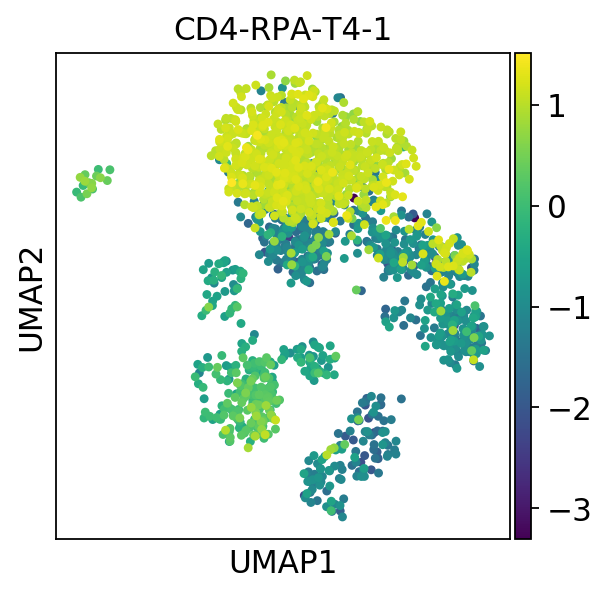

In [131]:
sc.pl.umap(cell_adata_two_comb_sng_1542,color='CD4-RPA-T4-1')

In [93]:
sc.tl.rank_genes_groups(cell_adata_comb,groupby='leiden')

ranking genes
    consider 'leiden' groups: ['0' '1' '2' '3' '4' '5' '6' '7' '8' '9' '10' '11']
    with sizes: [7863 7735 5052 4971 3826  240  187  180  107   62   53   42]


/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:222: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))
/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:222: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))
/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:222: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))
/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:222: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))
/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:222: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldc

    finished (0:00:19.06) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


/usr/local/lib/python3.6/dist-packages/scanpy/tools/_rank_genes_groups.py:222: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))


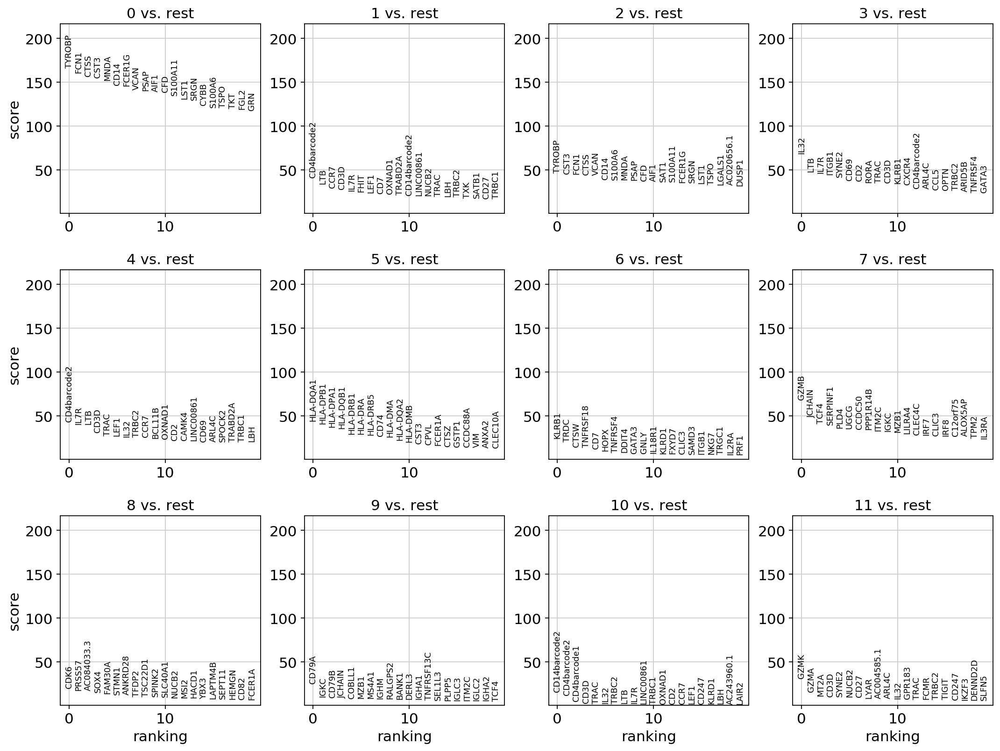

In [94]:
sc.pl.rank_genes_groups(cell_adata_comb,)

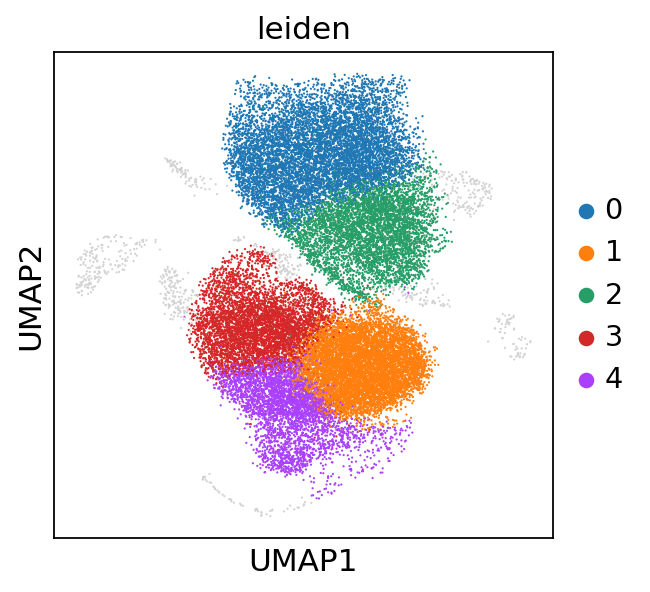

In [95]:
sc.pl.umap(cell_adata_comb,color=['leiden'],groups=[str(i) for i in range(0,5)])

In [96]:
cells_keep_core = cell_adata_comb[cell_adata_comb.obs['leiden'].astype(int) <= 4].obs_names

Going to save cells_keep and rerun a separate notebook with only these cells.

In [97]:
with open(prefix + 'cells.keep.core.txt','w') as file:
    [file.write(i + '\n') for i in cells_keep_core]

In [98]:
print(len(mymux.sngdbl()))
print(len(cell_adata_comb))
print(len(cells_keep_core))

31119
30318
29447
